In [119]:
import pandas as pd

Replace 'your_file.json' with the path to your JSON file

In [120]:
df1 = pd.read_json("/content/drive/MyDrive/archive (14)/schedules.json")
df2 = pd.read_json("/content/drive/MyDrive/archive (14)/stations.json")
df3 = pd.read_json("/content/drive/MyDrive/archive (14)/trains.json")

In [121]:
import os
import pandas as pd
import json
import geopandas as gpd
import plotly.express as px
import numpy  as np
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import LineString, Point

In [122]:
df1.head()

,arrival,day,train_name,station_name,station_code,id,train_number,departure
0,None,1.0,Falaknuma Lingampalli MMTS,KACHEGUDA FALAKNUMA,FM,302214,47154,07:55:00
1,None,1.0,Thrissur Guruvayur Passenger,THRISUR,TCR,281458,56044,18:55:00
2,None,1.0,Porbandar Muzaffarpur Express,PORBANDAR,PBR,309335,19269,15:05:00
3,None,1.0,RAIPUR ITWARI PASS,RAIPUR JN,R,283774,58205,13:30:00
4,None,1.0,Gomoh-Asansol MEMU,GOMOH JN,GMO,319937,63542,07:20:00


In [123]:
df2.head()

,type,features
0,FeatureCollection,"{'geometry': {'type': 'Point', 'coordinates': ..."
1,FeatureCollection,"{'geometry': None, 'type': 'Feature', 'propert..."
2,FeatureCollection,"{'geometry': None, 'type': 'Feature', 'propert..."
3,FeatureCollection,"{'geometry': None, 'type': 'Feature', 'propert..."
4,FeatureCollection,"{'geometry': {'type': 'Point', 'coordinates': ..."


In [124]:
df3.head()

,type,features
0,FeatureCollection,"{'geometry': {'type': 'LineString', 'coordinat..."
1,FeatureCollection,"{'geometry': {'type': 'LineString', 'coordinat..."
2,FeatureCollection,"{'geometry': {'type': 'LineString', 'coordinat..."
3,FeatureCollection,"{'geometry': {'type': 'LineString', 'coordinat..."
4,FeatureCollection,"{'geometry': {'type': 'LineString', 'coordinat..."


In [125]:
print(df3.head(1))

                type                                           features
0  FeatureCollection  {'geometry': {'type': 'LineString', 'coordinat...


In [126]:

def convert_to_gdf(json_data, geometry_type):
    """
    Converts JSON data into a GeoDataFrame.

    Args:
        json_data (dict): The input JSON data containing geographic features.
        geometry_type (str): The type of geometry ('Point' or 'LineString').

    Returns:
        gpd.GeoDataFrame: The resulting GeoDataFrame.
    """
    if geometry_type == 'Point':
        gdf = _create_point_gdf(json_data)
    elif geometry_type == 'LineString':
        gdf = _create_linestring_gdf(json_data)
    else:
        raise ValueError(f"Invalid geometry_type: {geometry_type}. "
                         f"Expected 'Point' or 'LineString'.")

    # setting the CRS
    gdf = gdf.set_crs('EPSG:4326')
    return gdf


def _create_point_gdf(json_data):
    """Creates a GeoDataFrame from point-based JSON data."""
    return gpd.GeoDataFrame.from_features(features=json_data['features'])


def _create_linestring_gdf(json_data):
    """Creates a GeoDataFrame from LineString-based JSON data."""
    properties_columns = list(json_data['features'][0]['properties'].keys())
    properties_vals = [list(i['properties'].values()) for i in json_data['features']]

    geometry_col = [
        LineString(i['geometry']['coordinates'])
        if len(i['geometry']['coordinates']) >= 2
        else LineString([i['geometry']['coordinates'][0]] * 2)  # Handle single-coordinate LineStrings
        for i in json_data['features']
    ]

    df = pd.DataFrame(data=properties_vals, columns=properties_columns)
    df['geometry'] = geometry_col
    return gpd.GeoDataFrame(df)
stations_gdf = convert_to_gdf(df2,'Point')
trains_gdf = convert_to_gdf(df3,'LineString')

In [127]:
stations_gdf.head()

,geometry,state,code,name,zone,address
0,POINT (75.45165 27.25206),Rajasthan,BDHL,Badhal,NWR,"Kishangarh Renwal, Rajasthan"
1,None,None,XX-BECE,XX-BECE,None,None
2,None,None,XX-BSPY,XX-BSPY,None,None
3,None,None,YY-BPLC,YY-BPLC,None,None
4,POINT (79.51975 28.91343),Uttar Pradesh,KHH,KICHHA,NER,"Kichha, Uttar Pradesh"


In [128]:
trains_gdf.head()

,third_ac,arrival,from_station_code,name,zone,chair_car,first_class,duration_m,sleeper,from_station_name,...,return_train,to_station_code,second_ac,classes,to_station_name,duration_h,type,first_ac,distance,geometry
0,0,12:15:00,JAT,Jammu Tawi Udhampur Special,NR,0,0,35.0,0,JAMMU TAWI,...,04602,UHP,0,,UDHAMPUR,1.0,DEMU,0,53.0,"LINESTRING (74.88012 32.70698, 74.95334 32.762..."
1,0,08:35:00,UHP,UDHAMPUR JAMMUTAWI DMU,NR,0,0,50.0,0,UDHAMPUR,...,04601,JAT,0,,JAMMU TAWI,1.0,DEMU,0,53.0,"LINESTRING (75.15488 32.92664, 75.14543 32.863..."
2,0,17:50:00,JAT,JAT UDAHMPUR DMU,NR,0,0,35.0,0,JAMMU TAWI,...,04604,UHP,0,,UDHAMPUR,1.0,DEMU,0,53.0,"LINESTRING (74.88012 32.70698, 74.95334 32.762..."
3,0,19:50:00,UHP,UDHAMPUR JAMMUTAWI DMU,NR,0,0,30.0,0,UDHAMPUR,...,04603,JAT,0,,JAMMU TAWI,1.0,DEMU,0,53.0,"LINESTRING (75.15488 32.92664, 75.14543 32.863..."
4,1,12:30:00,BDTS,Mumbai BandraT-Bikaner SF Special,NWR,0,0,55.0,1,MUMBAI BANDRA TERMINUS,...,04727,BKN,1,,BIKANER JN,21.0,SF,0,1212.0,"LINESTRING (72.84054 19.06191, 72.84008 19.069..."


In [129]:
print("df1 shape:", df1.shape)
print("stations_gdf shape:", stations_gdf.shape)
print("trains_gdf shape:", trains_gdf.shape)

df1 shape: (417080, 8)
stations_gdf shape: (8990, 6)
trains_gdf shape: (5208, 22)


In [130]:
print("\nNulls in df1:\n", df1.isnull().sum())
print("\nNulls in stations_gdf:\n", stations_gdf.isnull().sum())
print("\nNulls in trains_gdf:\n", trains_gdf.isnull().sum())


Nulls in df1:
 arrival             0
day             22561
train_name          0
station_name        0
station_code        0
id                  0
train_number        0
departure           0
dtype: int64

Nulls in stations_gdf:
 geometry     293
state       4532
code           0
name           0
zone        4532
address     4532
dtype: int64

Nulls in trains_gdf:
 third_ac               0
arrival                0
from_station_code      0
name                   0
zone                   0
chair_car              0
first_class            0
duration_m            15
sleeper                0
from_station_name      0
number                 0
departure              0
return_train         599
to_station_code        0
second_ac              0
classes               15
to_station_name        0
duration_h            15
type                   0
first_ac               0
distance              15
geometry               0
dtype: int64


In [131]:
print("\ndf1 types:\n", df1.dtypes)
print("\nstations_gdf types:\n", stations_gdf.dtypes)
print("\ntrains_gdf types:\n", trains_gdf.dtypes)


df1 types:
 arrival          object
day             float64
train_name       object
station_name     object
station_code     object
id                int64
train_number     object
departure        object
dtype: object

stations_gdf types:
 geometry    geometry
state         object
code          object
name          object
zone          object
address       object
dtype: object

trains_gdf types:
 third_ac                int64
arrival                object
from_station_code      object
name                   object
zone                   object
chair_car               int64
first_class             int64
duration_m            float64
sleeper                 int64
from_station_name      object
number                 object
departure              object
return_train           object
to_station_code        object
second_ac               int64
classes                object
to_station_name        object
duration_h            float64
type                   object
first_ac                int64

**Unique zones and states**

In [132]:
print("Unique zones:", stations_gdf['zone'].unique())
print("Unique states:", stations_gdf['state'].dropna().unique())

Unique zones: ['NWR' None 'NER' 'SR' 'WR' 'ER' 'SCR' 'NR' 'CR' '?' 'WCR' 'NFR' 'NCR'
 'SECR' 'SWR' 'ECoR' 'SER' 'ECR' 'KR']
Unique states: ['Rajasthan' 'Uttar Pradesh' 'Tamil Nadu' 'Haryana' 'Madhya Pradesh'
 'West Bengal' 'Andhra Pradesh' 'Punjab' 'Maharashtra' 'Gujarat' 'Assam'
 '' 'Tripura' 'Karnataka' 'Jharkhand' 'Orissa' 'Delhi NCT' 'Goa' 'Kerala'
 'Bihar' 'Chhattisgarh' 'Uttarakhand' 'Himachal Pradesh'
 'Jammu and Kashmir' 'Odisha' 'Mizoram' 'Chandigarh' 'Bangladesh'
 'Nagaland' 'Puducherry']


Plot stations on map (if using geopandas)

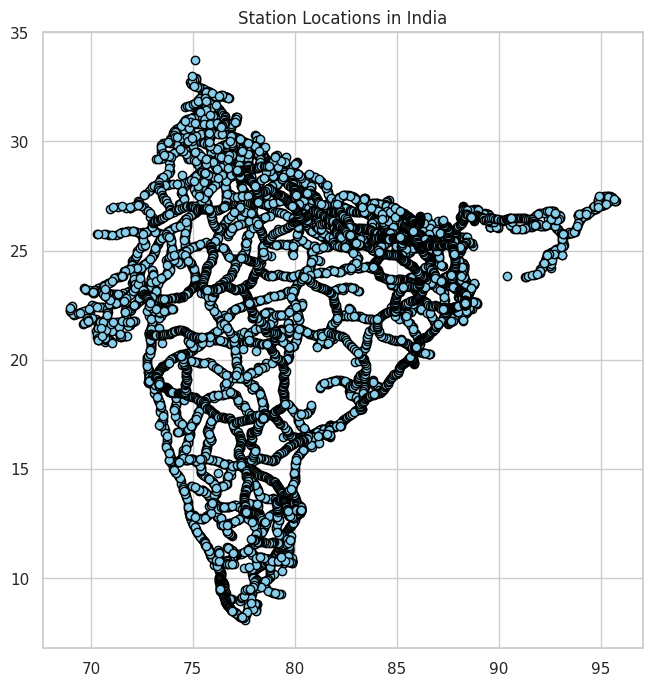

In [133]:
stations_gdf.dropna(subset=['geometry']).plot(figsize=(12, 8), color='skyblue', edgecolor='black')
plt.title("Station Locations in India")
plt.show()

**Sample a few geometries**

In [134]:
trains_gdf[['name', 'geometry']].head()

,name,geometry
0,Jammu Tawi Udhampur Special,"LINESTRING (74.88012 32.70698, 74.95334 32.762..."
1,UDHAMPUR JAMMUTAWI DMU,"LINESTRING (75.15488 32.92664, 75.14543 32.863..."
2,JAT UDAHMPUR DMU,"LINESTRING (74.88012 32.70698, 74.95334 32.762..."
3,UDHAMPUR JAMMUTAWI DMU,"LINESTRING (75.15488 32.92664, 75.14543 32.863..."
4,Mumbai BandraT-Bikaner SF Special,"LINESTRING (72.84054 19.06191, 72.84008 19.069..."


**Plot train routes using GeoPandas**

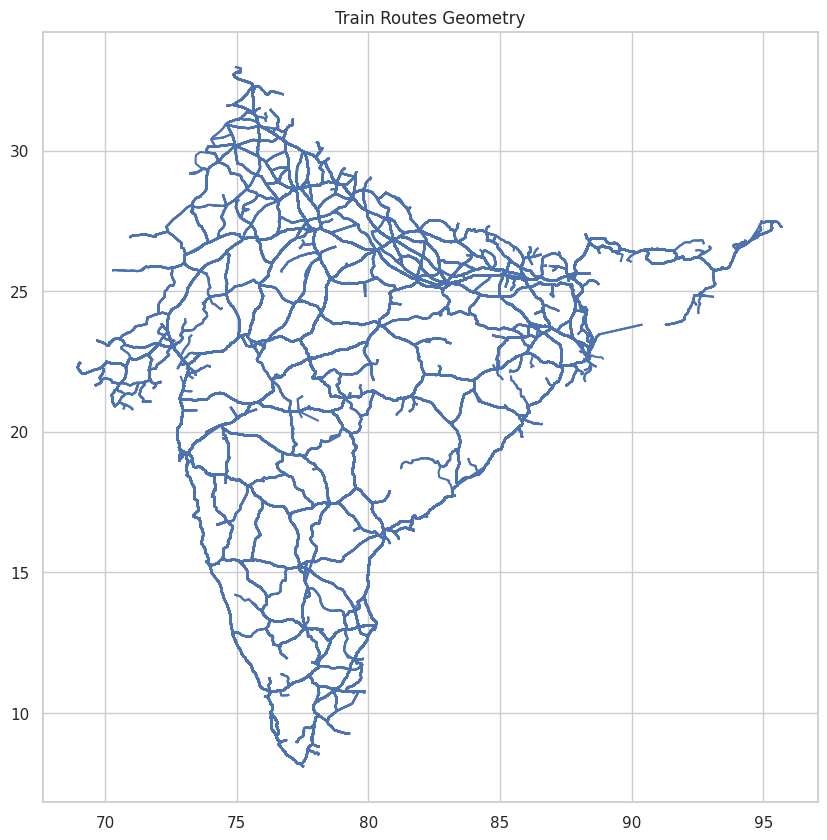

In [135]:
trains_gdf.dropna(subset=['geometry']).plot(figsize=(12, 10))
plt.title("Train Routes Geometry")
plt.show()

**Merge zone from stations_gdf into df1**

In [136]:
df_merged = df1.merge(
stations_gdf[['code', 'zone', 'geometry']],
left_on='station_code',
right_on='code',
how='left'
)

**Filter stations in 'NWR' zone**

In [137]:
nwr_stations = df_merged[df_merged['zone'] == 'NWR']

Show unique station names and codes

In [138]:
print(nwr_stations[['station_name', 'station_code']].drop_duplicates())

             station_name station_code
49               AJMER JN          AII
94           UDAIPUR CITY          UDZ
211                 Hisar          HSR
324                REWARI           RE
361     Sadulpur Junction         SDLP
...                   ...          ...
285174             Surera         SURR
285555            Sirsala         SRSL
304424           Bhukarka         BKKA
359406          Hansiawas         HSWS
367802           Paharsar         PRSR

[425 rows x 2 columns]


In [139]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [140]:
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)
print("DF1 Head:\n", df1.head())
print("\nDF1 Info:\n")
df1.info()
print("\nMissing Values:\n", df1.isnull().sum())

DF1 Head:
   arrival  day                     train_name         station_name  \
0    None  1.0     Falaknuma Lingampalli MMTS  KACHEGUDA FALAKNUMA   
1    None  1.0   Thrissur Guruvayur Passenger              THRISUR   
2    None  1.0  Porbandar Muzaffarpur Express            PORBANDAR   
3    None  1.0             RAIPUR ITWARI PASS            RAIPUR JN   
4    None  1.0             Gomoh-Asansol MEMU             GOMOH JN   

  station_code      id train_number departure  
0           FM  302214        47154  07:55:00  
1          TCR  281458        56044  18:55:00  
2          PBR  309335        19269  15:05:00  
3            R  283774        58205  13:30:00  
4          GMO  319937        63542  07:20:00  

DF1 Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 417080 entries, 0 to 417079
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   arrival       417080 non-null  object 
 1   day           394519 

**Convert time columns**

In [141]:
df1['arrival'] = pd.to_datetime(df1['arrival'], errors='coerce')
df1['departure'] = pd.to_datetime(df1['departure'], errors='coerce')

<ipython-input-141-fe7c0b6f08bc>:1: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

<ipython-input-141-fe7c0b6f08bc>:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



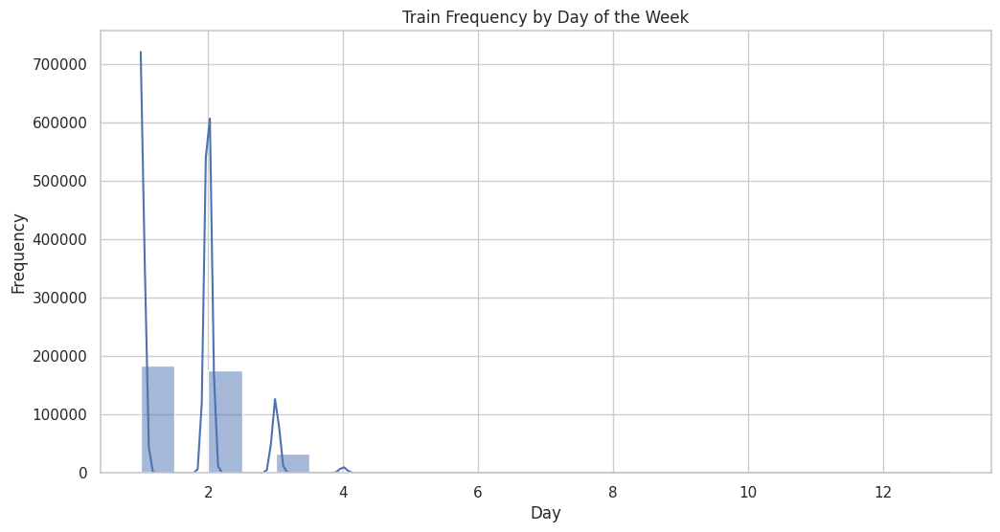

In [142]:
sns.histplot(df1['day'].dropna(), bins=24, kde=True)  # Changed 'hour' to 'day'
plt.title("Train Frequency by Day of the Week")  # Changed title accordingly
plt.xlabel("Day")  # Changed x-axis label
plt.ylabel("Frequency")
plt.show()

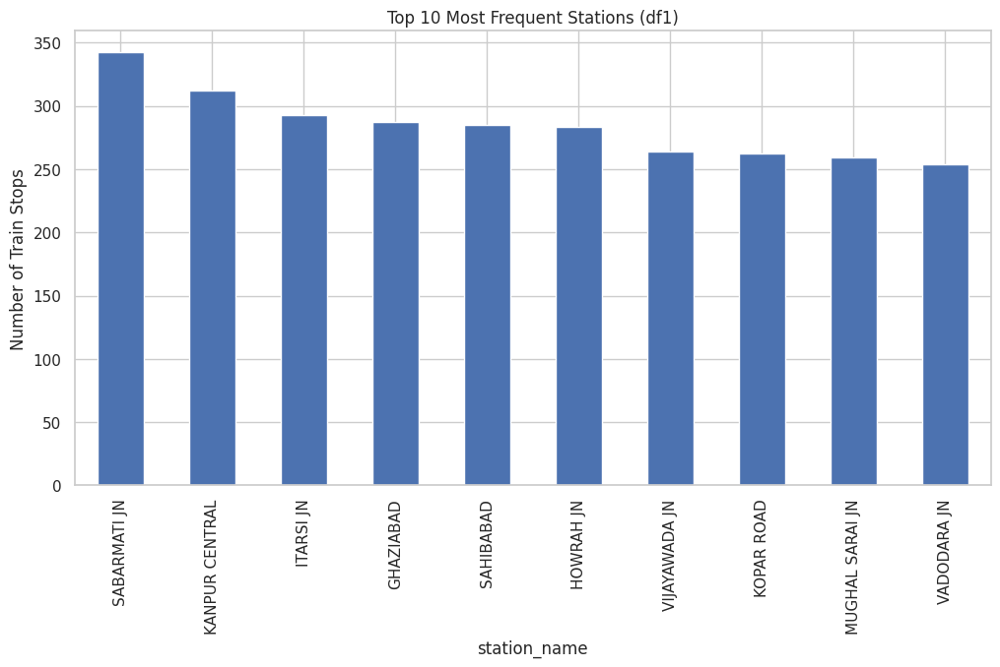

In [143]:
top_stations = df1['station_name'].value_counts().head(10)
top_stations.plot(kind='bar', title="Top 10 Most Frequent Stations (df1)")
plt.ylabel("Number of Train Stops")
plt.show()


In [144]:
print("Trains GDF Head:\n", trains_gdf.head())
print("\nTrains GDF Info:\n")
trains_gdf.info()

Trains GDF Head:
    third_ac   arrival from_station_code                               name  \
0         0  12:15:00               JAT        Jammu Tawi Udhampur Special   
1         0  08:35:00               UHP             UDHAMPUR JAMMUTAWI DMU   
2         0  17:50:00               JAT                   JAT UDAHMPUR DMU   
3         0  19:50:00               UHP             UDHAMPUR JAMMUTAWI DMU   
4         1  12:30:00              BDTS  Mumbai BandraT-Bikaner SF Special   

  zone  chair_car  first_class  duration_m  sleeper       from_station_name  \
0   NR          0            0        35.0        0              JAMMU TAWI   
1   NR          0            0        50.0        0                UDHAMPUR   
2   NR          0            0        35.0        0              JAMMU TAWI   
3   NR          0            0        30.0        0                UDHAMPUR   
4  NWR          0            0        55.0        1  MUMBAI BANDRA TERMINUS   

   ... return_train to_station_code se

In [145]:
print("\nMissing Values:\n", trains_gdf.isnull().sum())


Missing Values:
 third_ac               0
arrival                0
from_station_code      0
name                   0
zone                   0
chair_car              0
first_class            0
duration_m            15
sleeper                0
from_station_name      0
number                 0
departure              0
return_train         599
to_station_code        0
second_ac              0
classes               15
to_station_name        0
duration_h            15
type                   0
first_ac               0
distance              15
geometry               0
dtype: int64


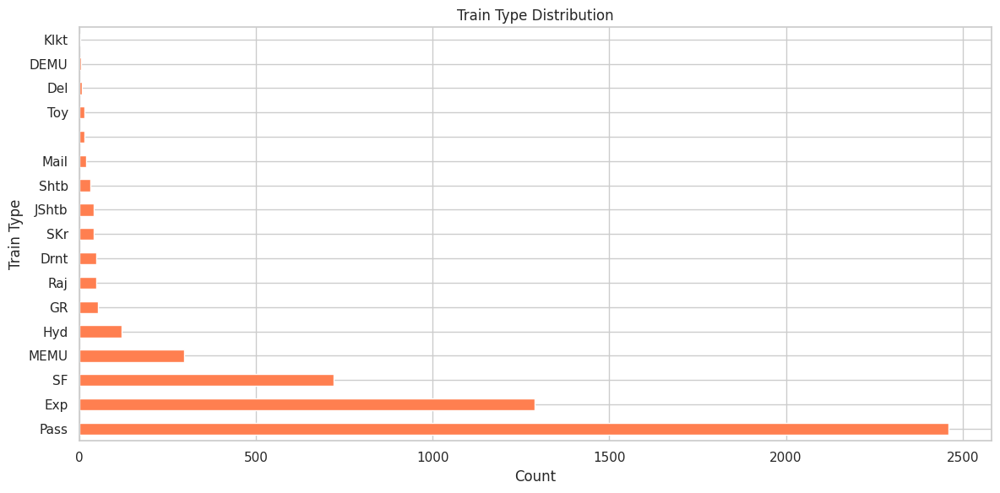

In [219]:
train_type_counts = trains_gdf['type'].value_counts()

train_type_counts.plot(kind='barh', color='coral')
plt.title("Train Type Distribution")
plt.xlabel("Count")
plt.ylabel("Train Type")
plt.tight_layout()
plt.show()


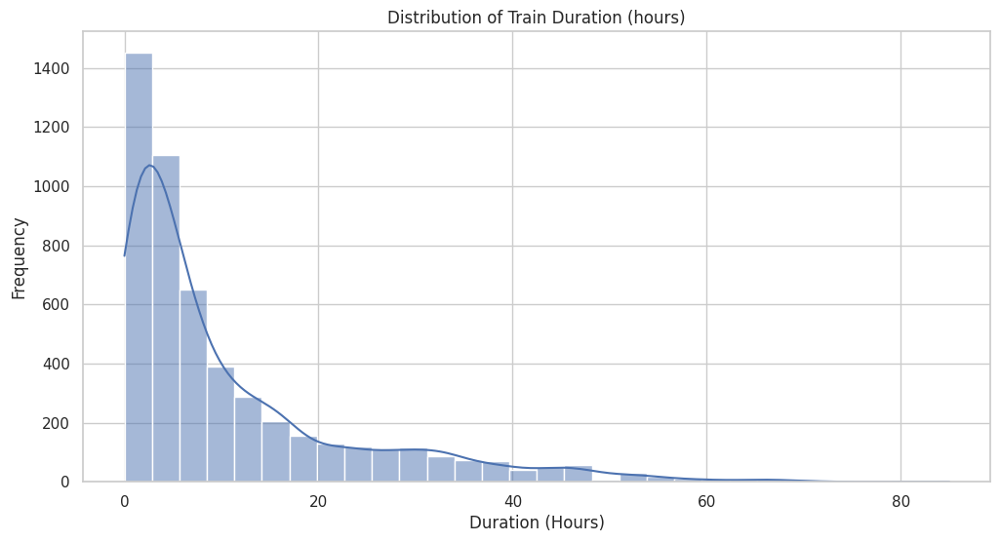

In [147]:
sns.histplot(trains_gdf['duration_h'].dropna(), bins=30, kde=True)
plt.title("Distribution of Train Duration (hours)")
plt.xlabel("Duration (Hours)")
plt.ylabel("Frequency")
plt.show()

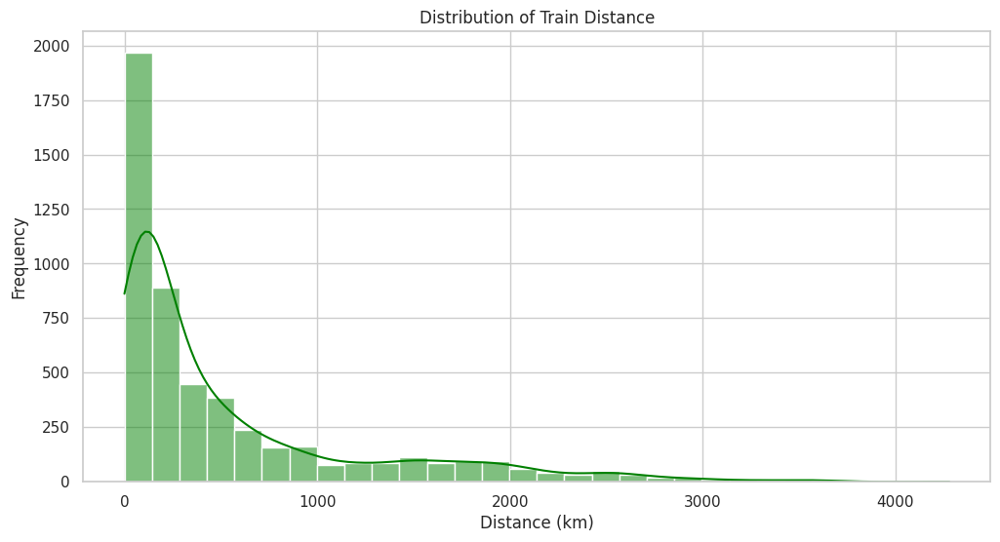

In [148]:
sns.histplot(trains_gdf['distance'].dropna(), bins=30, kde=True, color='green')
plt.title("Distribution of Train Distance")
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.show()

In [149]:
class_columns = ['first_ac', 'second_ac', 'third_ac', 'sleeper', 'chair_car', 'first_class']

**Sum of each class column**

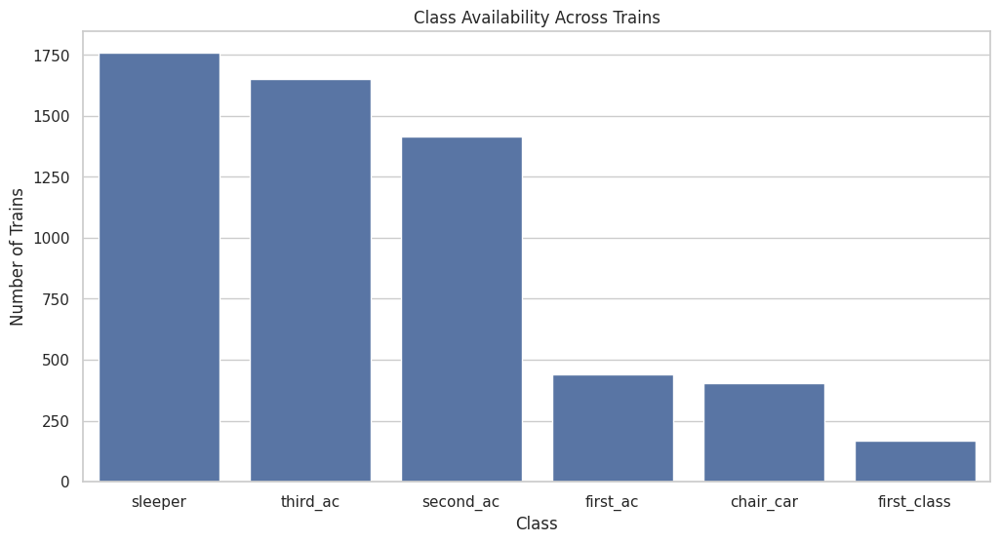

In [150]:
class_availability = trains_gdf[class_columns].sum().sort_values(ascending=False)
sns.barplot(x=class_availability.index, y=class_availability.values)
plt.title("Class Availability Across Trains")
plt.xlabel("Class")
plt.ylabel("Number of Trains")
plt.show()

In [151]:
print("Stations GDF Head:\n", stations_gdf.head())
print("\nStations GDF Info:\n")
stations_gdf.info()

Stations GDF Head:
                     geometry          state     code     name  zone  \
0  POINT (75.45165 27.25206)      Rajasthan     BDHL   Badhal   NWR   
1                       None           None  XX-BECE  XX-BECE  None   
2                       None           None  XX-BSPY  XX-BSPY  None   
3                       None           None  YY-BPLC  YY-BPLC  None   
4  POINT (79.51975 28.91343)  Uttar Pradesh      KHH   KICHHA   NER   

                        address  
0  Kishangarh Renwal, Rajasthan  
1                          None  
2                          None  
3                          None  
4         Kichha, Uttar Pradesh  

Stations GDF Info:

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8990 entries, 0 to 8989
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  8697 non-null   geometry
 1   state     4458 non-null   object  
 2   code      8990 non-null   object  
 3   name     

In [152]:
print("\nMissing Values:\n", stations_gdf.isnull().sum())


Missing Values:
 geometry     293
state       4532
code           0
name           0
zone        4532
address     4532
dtype: int64


**Get top 10 states with most stations**

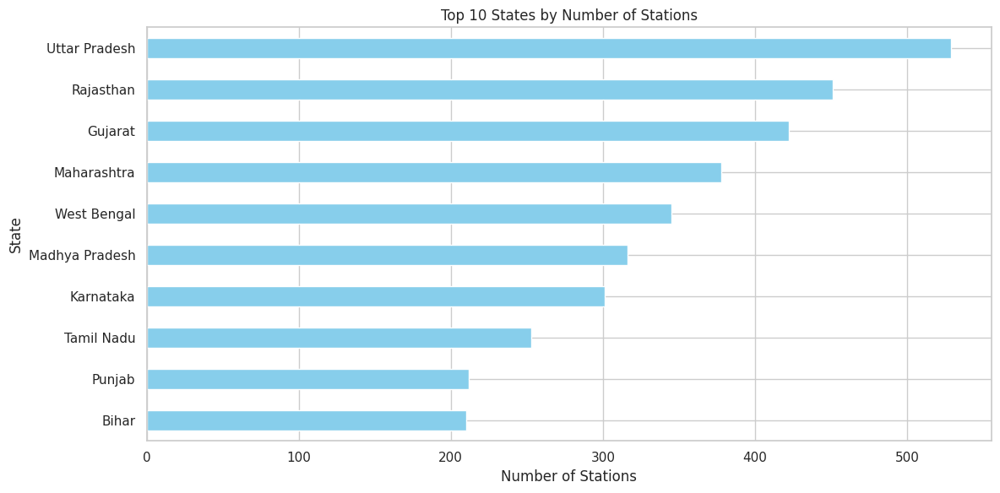

In [153]:
state_counts.plot(kind='barh', color='skyblue')
plt.title("Top 10 States by Number of Stations")
plt.xlabel("Number of Stations")
plt.ylabel("State")
plt.gca().invert_yaxis()  # Optional: Highest value on top
plt.tight_layout()
plt.show()


Plot using GeoPandas' built-in geometry

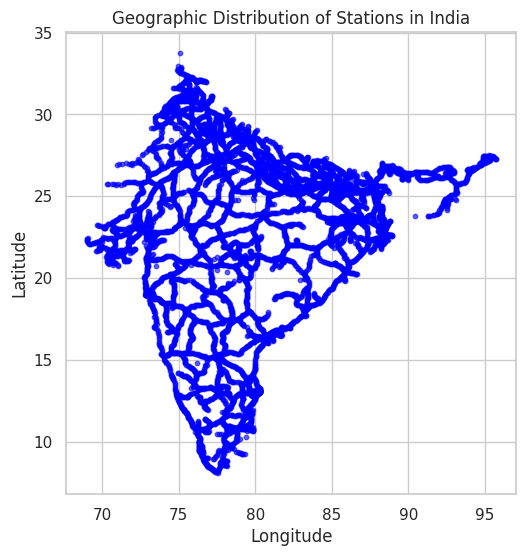

In [154]:
stations_gdf.plot(markersize=10, color='blue', alpha=0.6)
plt.title("Geographic Distribution of Stations in India")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

**Convert all column names to lowercase for consistency**

In [155]:
df1.columns = df1.columns.str.lower()
trains_gdf.columns = trains_gdf.columns.str.lower()
stations_gdf.columns = stations_gdf.columns.str.lower()

In [156]:
for col in class_columns:
  if col in trains_gdf.columns:
    trains_gdf[col] = trains_gdf[col].fillna(0).astype(int)
stations_gdf = stations_gdf.drop_duplicates(subset='code')


In [157]:
df1 = df1.merge(
stations_gdf[['code', 'state', 'zone']],
how='left',
left_on='station_code',
right_on='code'
)

In [158]:
df1 = df1.merge(
trains_gdf[['number', 'zone', 'type', 'distance']],
how='left',
left_on='train_number',
right_on='number',
suffixes=('_station', '_train')
)

**Save the merged df1 with station and train metadata**

In [159]:
df1.to_csv("processed_df1.csv", index=False)

Ensure datetime columns are parsed

In [160]:
df1['arrival'] = pd.to_datetime(df1['arrival'], errors='coerce')
df1['departure'] = pd.to_datetime(df1['departure'], errors='coerce')

Feature: Arrival/Departure Hour

In [161]:
df1['arrival_hour'] = df1['arrival'].dt.hour
df1['departure_hour'] = df1['departure'].dt.hour

Feature: Is Night Train (between 10 PM and 5 AM)

In [162]:
df1['is_night_train'] = df1['departure_hour'].apply(lambda x: 1 if x >= 22 or x < 5 else 0)

Feature: Travel Day Category (Weekday/Weekend)

In [163]:
df1['travel_day_type'] = df1['day'].apply(lambda x: 'Weekend' if x in [6, 7] else 'Weekday')

Feature: Total number of stops per train

In [164]:
stops_per_train = df1.groupby('train_number')['station_code'].count().reset_index()
stops_per_train.columns = ['train_number', 'num_stops']
df1 = df1.merge(stops_per_train, on='train_number', how='left')

Feature: Position of station in route

In [165]:
df1['stop_position'] = df1.groupby('train_number').cumcount() + 1

Feature: How many trains stop at each station

In [166]:
station_popularity = df1['station_code'].value_counts().to_dict()
df1['station_popularity'] = df1['station_code'].map(station_popularity)

Convert zone columns to category codes (for ML)

In [167]:
df1['zone_train_code'] = df1['zone_train'].astype('category').cat.codes
df1['zone_station_code'] = df1['zone_station'].astype('category').cat.codes

Normalize distance (can help in clustering or modeling)

In [168]:
df1['distance_km_scaled'] = (df1['distance'] - df1['distance'].min()) / (df1['distance'].max() - df1['distance'].min())
df1.to_csv("df1_feature_engineered.csv", index=False)
print("✅ Feature-engineered data saved to df1_feature_engineered.csv")

✅ Feature-engineered data saved to df1_feature_engineered.csv


In [169]:
fig_arr = px.histogram(
df1,
x='arrival_hour',
nbins=24,                      # Ensure 24 bins for 24 hours
title='Train Arrival Hour Distribution', # Updated title
labels={'arrival_hour': 'Hour of Day (0-23)', 'count': 'Number of Trains'}, # Updated label
template='plotly_white'        # Use a clean white background template
)

In [170]:
fig_arr.update_traces(
marker_line_width=1,          # Add an outline to the bars
marker_line_color="black",
hovertemplate='<b>Hour:</b> %{x}<br><b>Trains:</b> %{y}<extra></extra>' # Updated hover text
# <extra></extra> removes the default trace info box
)

In [171]:
fig_dep = px.histogram(
df1,
x='departure_hour',
nbins=24,                      # Ensure 24 bins for 24 hours
title='Train Departure Hour Distribution', # Updated title
labels={'departure_hour': 'Hour of Day (0-23)', 'count': 'Number of Trains'}, # Updated label
template='plotly_white'        # Use a clean white background template
)
fig_dep.update_layout(
bargap=0.1,                   # Add a small gap between bars
yaxis_title="Number of Trains", # Updated y-axis title
xaxis=dict(
tickmode='linear',       # Use linear ticks on x-axis
dtick=1                  # Show a tick mark every 2 hours
)
)
fig_dep.update_traces(
marker_line_width=1,          # Add an outline to the bars
marker_line_color="black",
hovertemplate='<b>Hour:</b> %{x}<br><b>Trains:</b> %{y}<extra></extra>' # Updated hover text
# <extra></extra> removes the default trace info box
)

In [172]:
fig = px.pie(df1, names='is_night_train', title='Night vs Day Trains',
labels={0: 'Day Train', 1: 'Night Train'})
fig.show()



In [173]:
sns.set_theme(style="whitegrid")

In [174]:
df1.head()

,arrival,day,train_name,station_name,station_code,id,train_number,departure,code,state,...,arrival_hour,departure_hour,is_night_train,travel_day_type,num_stops,stop_position,station_popularity,zone_train_code,zone_station_code,distance_km_scaled
0,NaT,1.0,Falaknuma Lingampalli MMTS,KACHEGUDA FALAKNUMA,FM,302214,47154,2025-04-22 07:55:00,FM,None,...,NaN,7.0,0,Weekday,23,1,114,12,-1,0.008647
1,NaT,1.0,Thrissur Guruvayur Passenger,THRISUR,TCR,281458,56044,2025-04-22 18:55:00,TCR,None,...,NaN,18.0,0,Weekday,4,1,168,15,-1,0.005375
2,NaT,1.0,Porbandar Muzaffarpur Express,PORBANDAR,PBR,309335,19269,2025-04-22 15:05:00,PBR,Gujarat,...,NaN,15.0,0,Weekday,357,1,24,18,17,0.577238
3,NaT,1.0,RAIPUR ITWARI PASS,RAIPUR JN,R,283774,58205,2025-04-22 13:30:00,R,None,...,NaN,13.0,0,Weekday,41,1,132,13,-1,0.069642
4,NaT,1.0,Gomoh-Asansol MEMU,GOMOH JN,GMO,319937,63542,2025-04-22 07:20:00,GMO,None,...,NaN,7.0,0,Weekday,17,1,114,5,-1,0.020332


In [175]:
for i, p in enumerate(ax.patches):
# Get the category name corresponding to the current bar using the specified order
  category = ax.get_xticklabels()[i].get_text()
# Get the count for this specific category (default to 0 if not found in counts)
count = counts.get(category, 0)
# Format the count number with commas
formatted_count = f'{count:,}'
# Place the annotation
ax.annotate(formatted_count,
            (p.get_x() + p.get_width() / 2., p.get_height()), # Position: center x, top y
            ha='center',          # Horizontal alignment: center
            va='center',          # Vertical alignment: center
            xytext=(0, 9),        # Offset the text slightly above the bar top
            textcoords='offset points')

Text(0, 9, '10')

In [176]:
ax.set_xlabel("Day Type", fontsize=12)
ax.set_ylabel("Number of Trips", fontsize=12)
ax.set_title('Train Trips on Weekdays vs Weekends', fontsize=14)

Text(0.5, 1.0, 'Train Trips on Weekdays vs Weekends')

In [177]:
if ax.patches: # Check if any bars were drawn
  max_height = max(p.get_height() for p in ax.patches)
# Use the actual count for the max height category for setting limit if needed
  max_count = counts.get(ax.get_xticklabels()[pd.Series([p.get_height() for p in ax.patches]).idxmax()].get_text(), 0)
  ax.set_ylim(0, max_count * 1.1 if max_count > 0 else 10) # Add 10% padding or set a small default
else:
  ax.set_ylim(0, 10) # Fallback if no data exists at all

In [178]:
plt.tight_layout() # Adjust layout
plt.show()

<Figure size 1200x600 with 0 Axes>

In [179]:
fig = px.histogram(df1, x='num_stops', nbins=60, title='Stops per Train')
fig.show()

In [180]:
fig = px.histogram(df1, x='stop_position', title='Stop Position Distribution')
fig.show()

In [181]:
top_stations = df1[['station_code', 'station_popularity']].drop_duplicates()
top_stations = top_stations.sort_values('station_popularity', ascending=False).head(20)

In [182]:
fig = px.bar(top_stations, x='station_code', y='station_popularity', title='Top 20 Most Visited Stations')
fig.show()

In [183]:
fig = px.histogram(df1, x='zone_train_code', title='Train Zone Code Distribution')
fig.show()

In [184]:

fig = px.histogram(df1, x='distance', nbins=30, title='Distance Distribution')
fig.show()

In [185]:
!pip install dash
import dash
from dash import dcc, html
import plotly.express as px
import pandas as pd

In [186]:
# Import necessary libraries
import dash
from dash import dcc, html
import plotly.express as px
import pandas as pd

# Initialize the Dash app
app = dash.Dash(__name__)

# Load the feature-engineered dataset
df1 = pd.read_csv("df1_feature_engineered.csv")

# ... (previous imports and app initialization) ...

# Define the layout of the dashboard
app.layout = html.Div(children=[
    html.H1("Indian Railways Feature Exploration Dashboard", style={'text-align': 'center'}),

    # Dropdowns for feature selection
    html.Div([
        dcc.Dropdown(
            id='feature-dropdown',
            options=[
                {'label': 'Arrival Hour Distribution', 'value': 'arrival_hour'},
                {'label': 'Departure Hour Distribution', 'value': 'departure_hour'},
                {'label': 'Night Train vs Day Train', 'value': 'is_night_train'},
                {'label': 'Trips by Day Type (Weekend vs Weekday)', 'value': 'travel_day_type'},
                {'label': 'Stops per Train', 'value': 'num_stops'},
                {'label': 'Stop Position Distribution', 'value': 'stop_position'}, # Added
                {'label': 'Top 20 Most Visited Stations', 'value': 'top_stations'}, # Added
                {'label': 'Train Zone Code Distribution', 'value': 'zone_train_code'}, # Added
                {'label': 'Station Zone Code Distribution', 'value': 'zone_station_code'}, # Added
                {'label': 'Normalized Distance Distribution', 'value': 'distance_km_scaled'},
                # ... (other options if needed) ...
            ],
            value='arrival_hour',
            style={'width': '50%'}
        ),
    ], style={'padding': '10px'}),

    # Graph to display the selected feature
    dcc.Graph(id='feature-graph'),

])

# Define the callback to update the graph
@app.callback(
    dash.dependencies.Output('feature-graph', 'figure'),
    [dash.dependencies.Input('feature-dropdown', 'value')]
)
def update_graph(selected_feature):
    # Generate the appropriate plot based on the selected feature
    if selected_feature == 'arrival_hour':
        fig = px.histogram(df1, x='arrival_hour', nbins=24, title='Arrival Hour Distribution')

    elif selected_feature == 'departure_hour':
        fig = px.histogram(df1, x='departure_hour', nbins=24, title='Departure Hour Distribution')

    elif selected_feature == 'is_night_train':
        fig = px.pie(df1, names='is_night_train', title='Night vs Day Trains',
                     labels={0: 'Day Train', 1: 'Night Train'})

    elif selected_feature == 'travel_day_type':
        fig = px.histogram(df1, x='travel_day_type', title='Trips by Day Type')

    elif selected_feature == 'num_stops':
        fig = px.histogram(df1, x='num_stops', nbins=20, title='Stops per Train')

    elif selected_feature == 'stop_position':  # Added for Stop Position Distribution
        fig = px.histogram(df1, x='stop_position', title='Stop Position Distribution')

    elif selected_feature == 'top_stations':  # Added for Top Stations
        top_stations = df1[['station_code', 'station_popularity']].drop_duplicates()
        top_stations = top_stations.sort_values('station_popularity', ascending=False).head(20)
        fig = px.bar(top_stations, x='station_code', y='station_popularity', title='Top 20 Most Visited Stations')

    elif selected_feature == 'zone_train_code':  # Added for Train Zone Code Distribution
        fig = px.histogram(df1, x='zone_train_code', title='Train Zone Code Distribution')

    elif selected_feature == 'zone_station_code':  # Added for Station Zone Code Distribution
        fig = px.histogram(df1, x='zone_station_code', title='Station Zone Code Distribution')

    elif selected_feature == 'distance_km_scaled':
        fig = px.histogram(df1, x='distance_km_scaled', nbins=30, title='Normalized Distance Distribution')

    return fig

# ... (rest of the code remains the same) ...

# Run the app
if __name__ == '__main__':
    app.run(debug=True)  # Run method without the obsolete warning


<IPython.core.display.Javascript object>

In [187]:
import geopandas as gpd
mj=gpd.read_file("/content/drive/MyDrive/India-State-and-Country-Shapefile-Updated-Jan-2020-master/India-State-and-Country-Shapefile-Updated-Jan-2020-master/India_State_Boundary.shp")

In [188]:
mj.head()


,State_Name,geometry
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034..."
1,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.4 3..."
2,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223..."
3,Delhi,"POLYGON ((8583390.57 3359116.19, 8583476.212 3..."
4,Haryana,"POLYGON ((8524318.539 3516490.865, 8524451.392..."


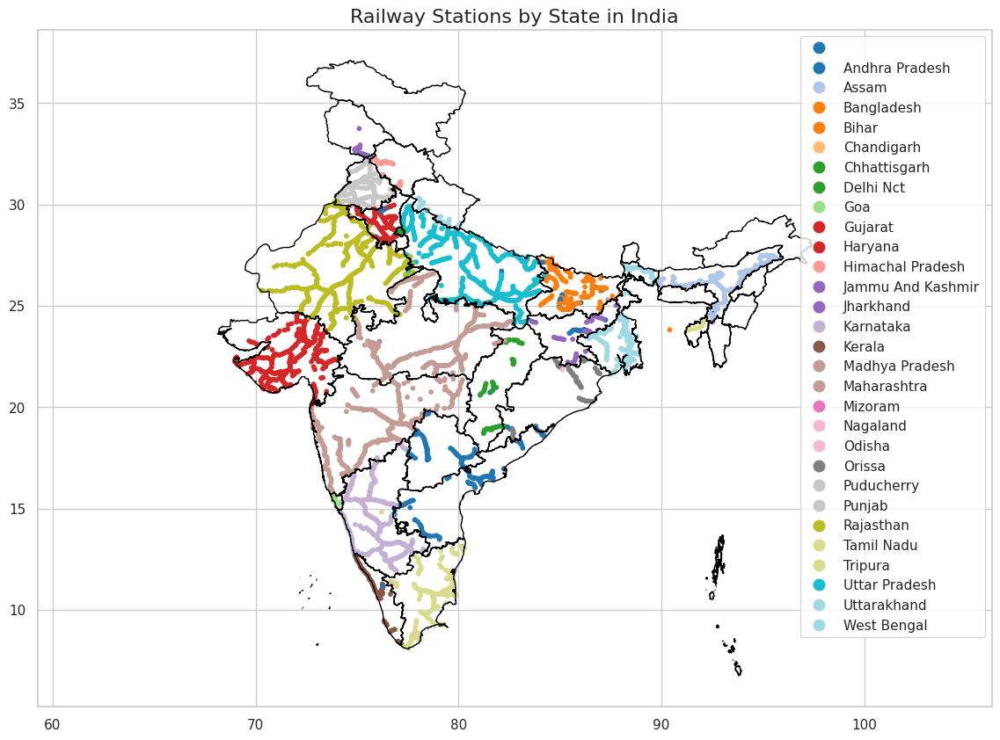

In [189]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Make sure both GeoDataFrames use the same CRS
stations_gdf = stations_gdf.to_crs(epsg=4326)
mj = mj.to_crs(epsg=4326)

# Rename 'State_Name' column to 'state' to match stations_gdf for easier plotting
mj = mj.rename(columns={"State_Name": "state"})

# Optional: Clean state names in both datasets (standardize spacing/case if needed)
stations_gdf['state'] = stations_gdf['state'].str.strip().str.title()
mj['state'] = mj['state'].str.strip().str.title()

# Now plot
fig, ax = plt.subplots(figsize=(14, 10))

# Plot state boundaries
mj.boundary.plot(ax=ax, linewidth=1, edgecolor='black')

# Plot stations, colored by state
stations_gdf.plot(ax=ax, column='state', cmap='tab20', markersize=10, legend=True)

# Final touches
plt.title("Railway Stations by State in India", fontsize=16)
plt.axis("equal")
plt.show()


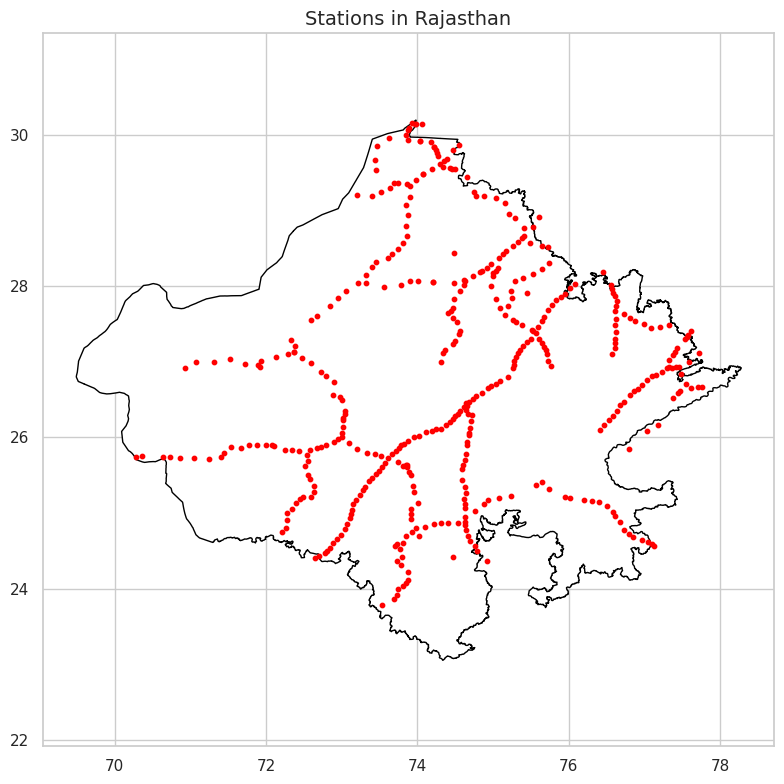

Skipping None (no matching boundary found)


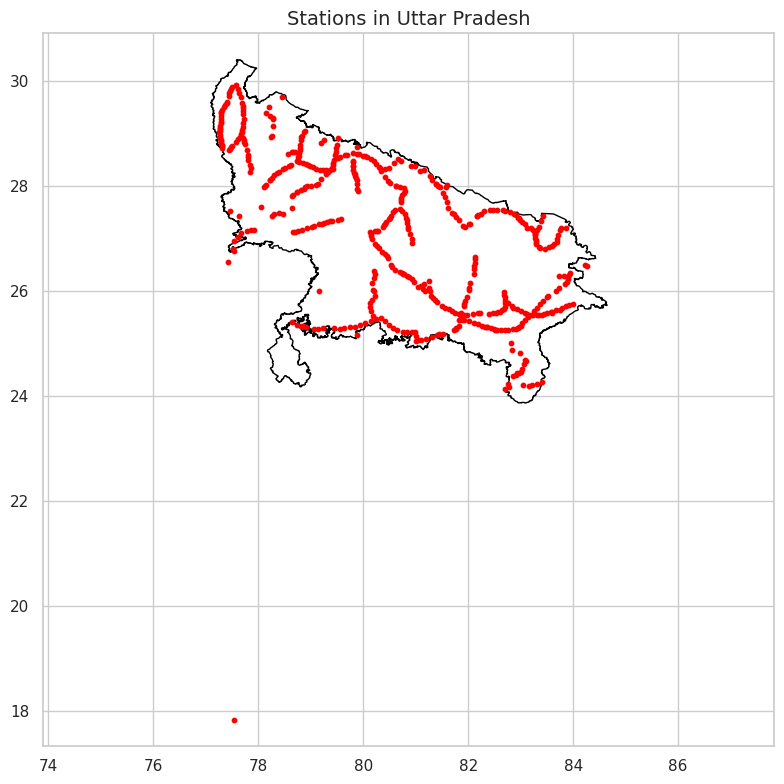

Skipping Tamil Nadu (no matching boundary found)


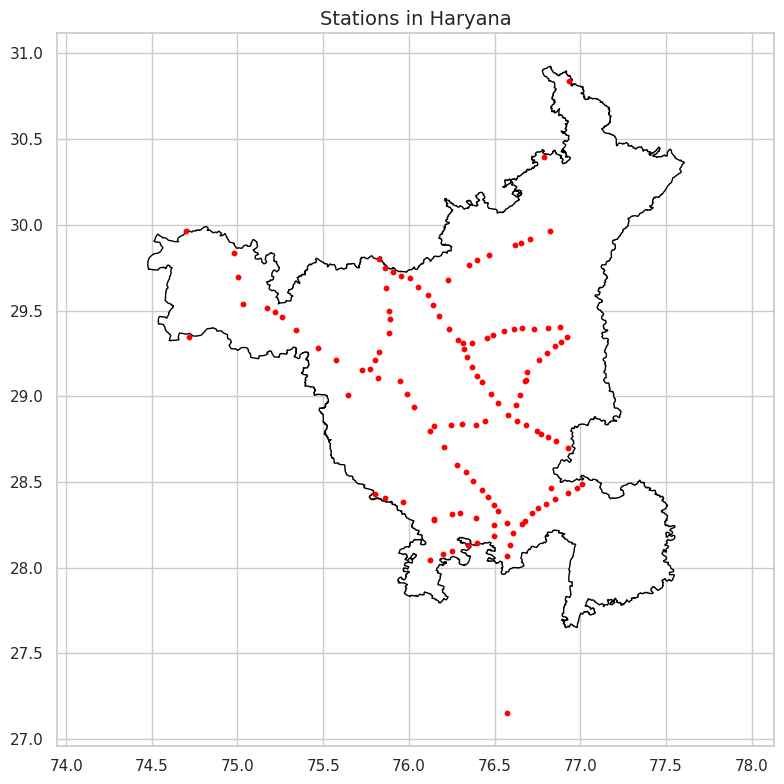

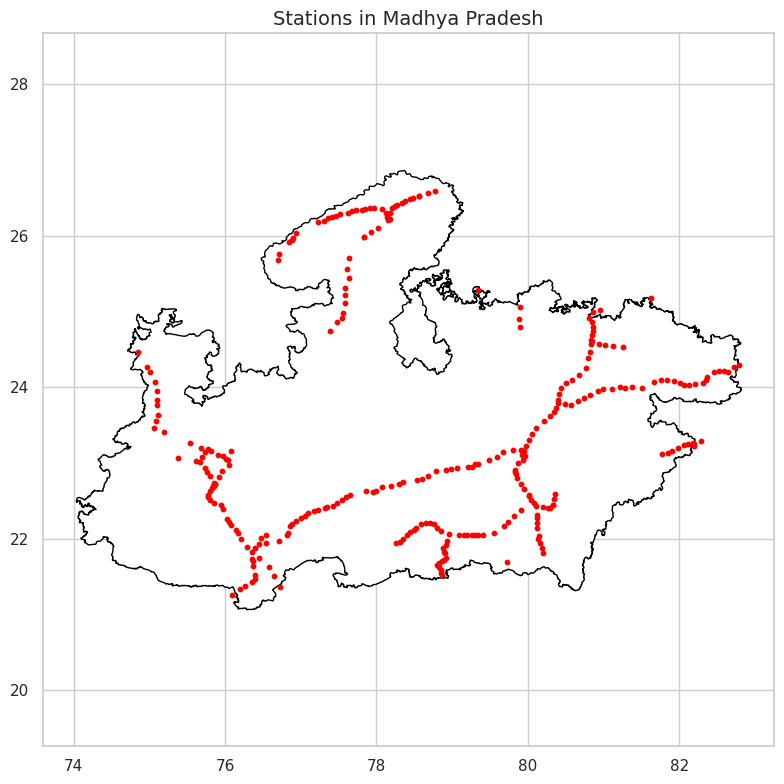

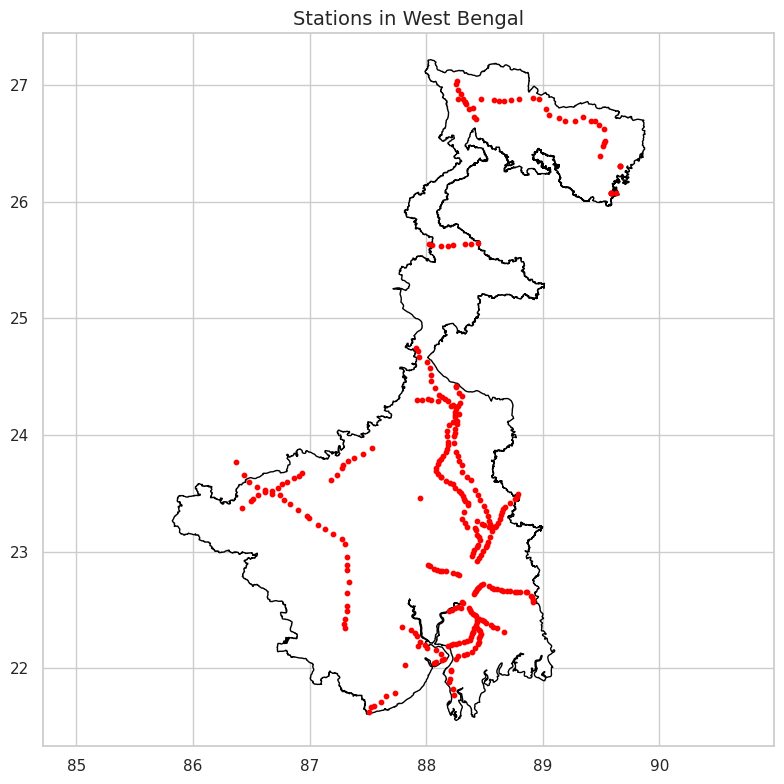

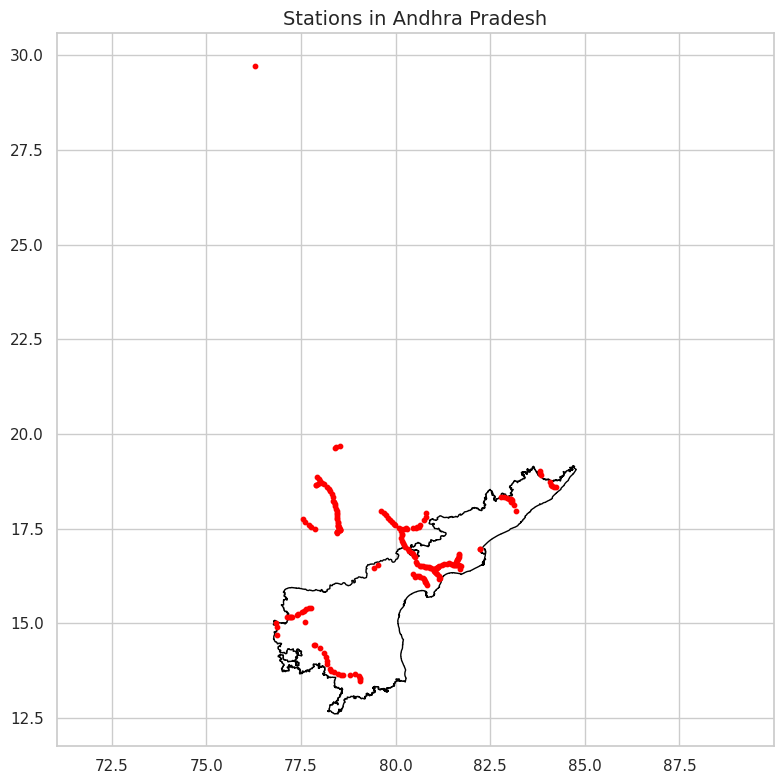

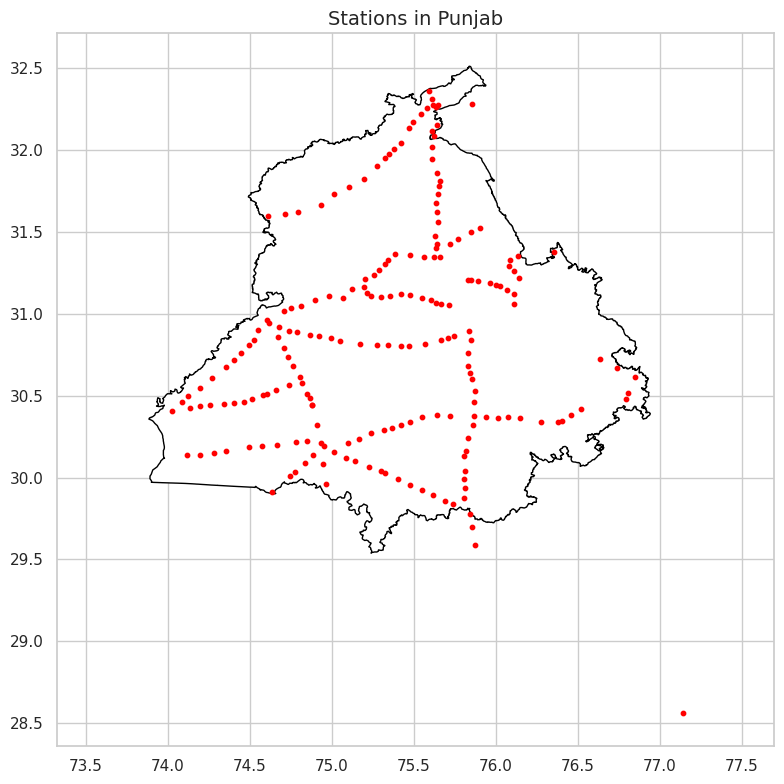

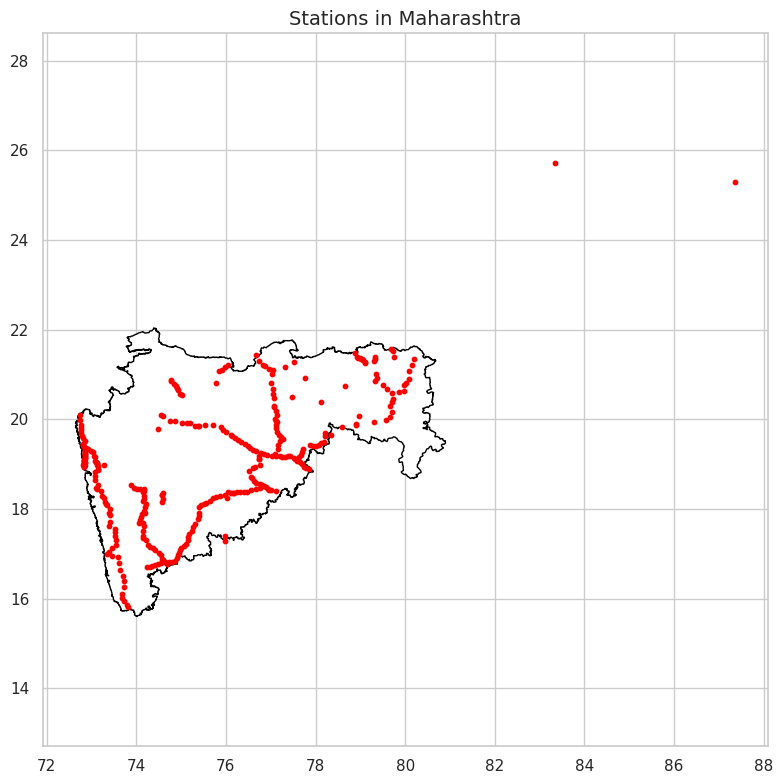

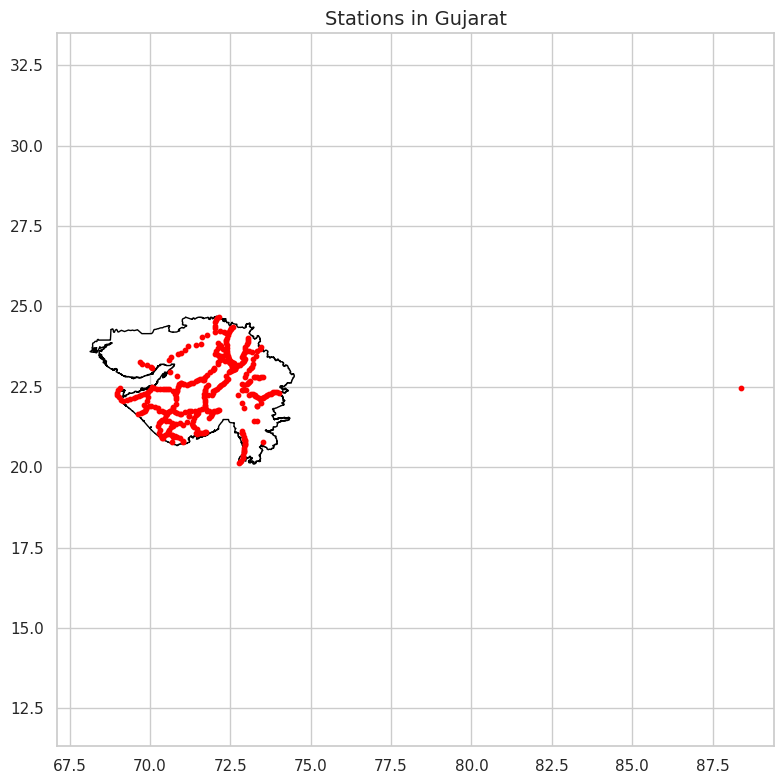

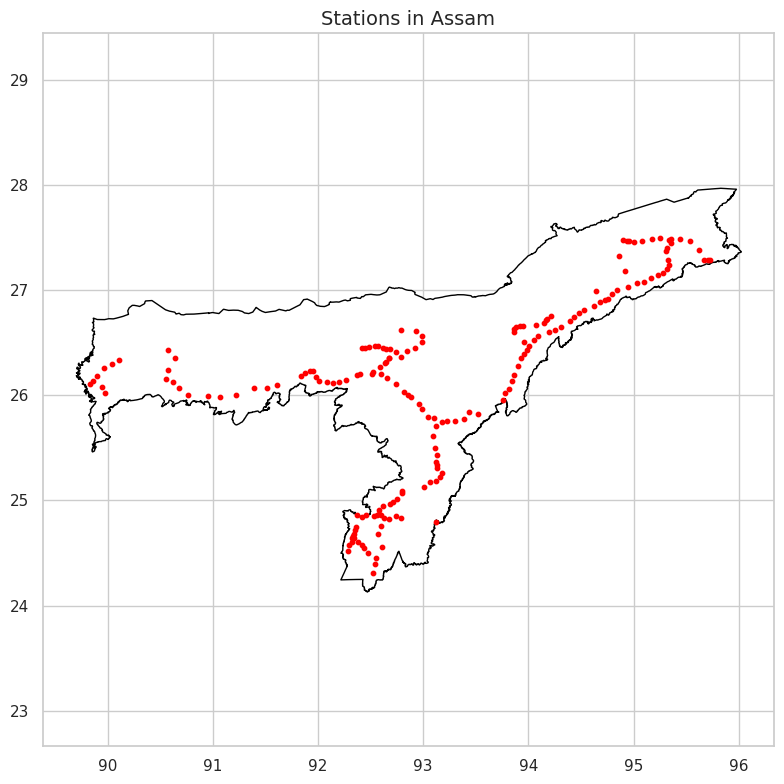

Skipping  (no matching boundary found)


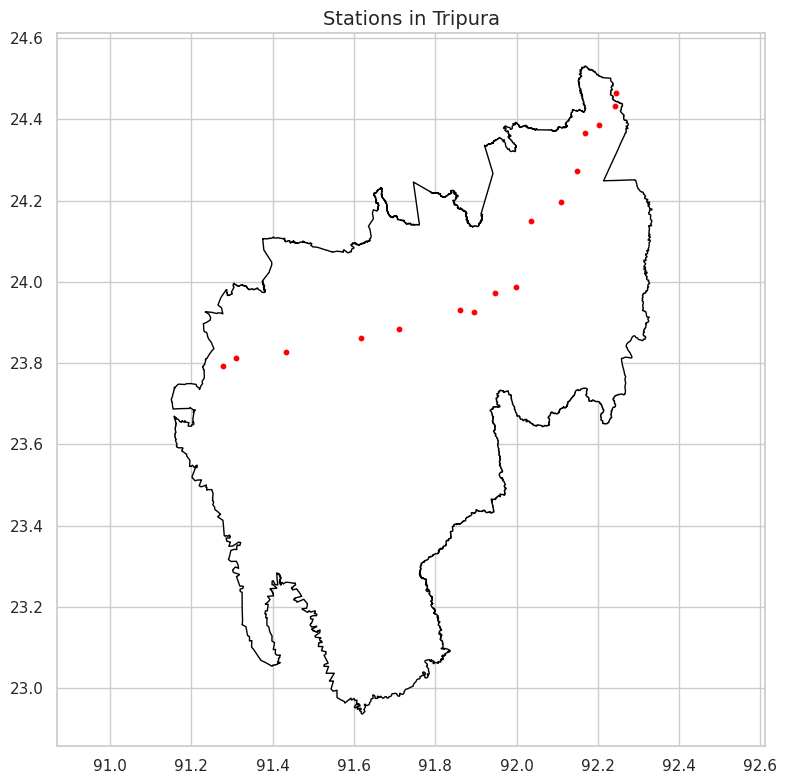

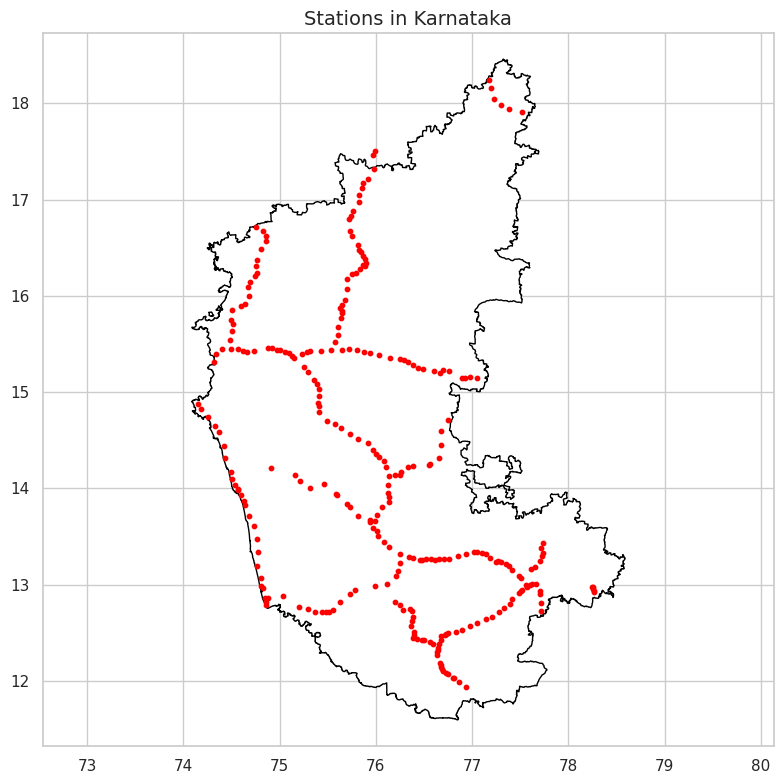

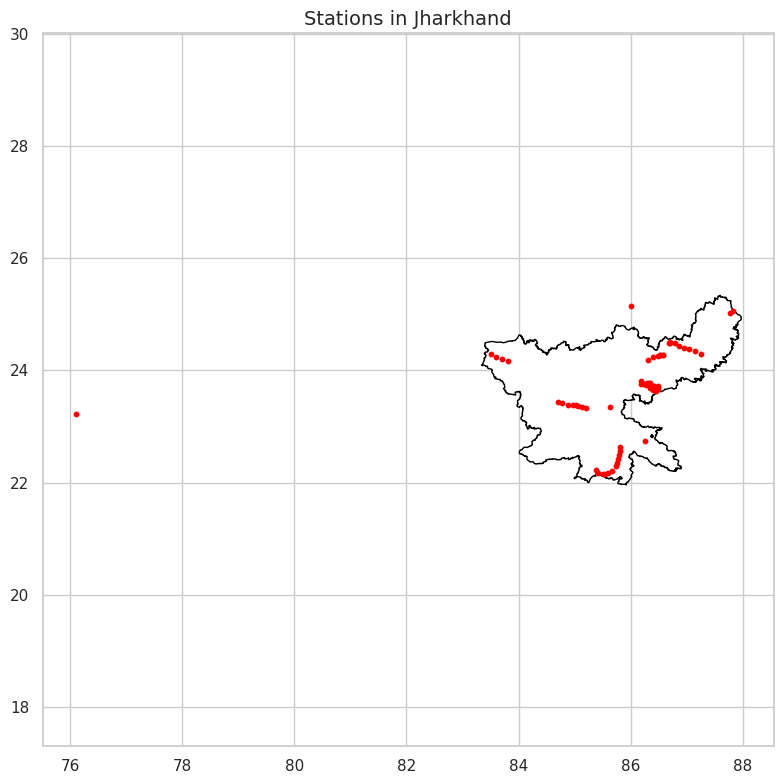

Skipping Orissa (no matching boundary found)
Skipping Delhi Nct (no matching boundary found)


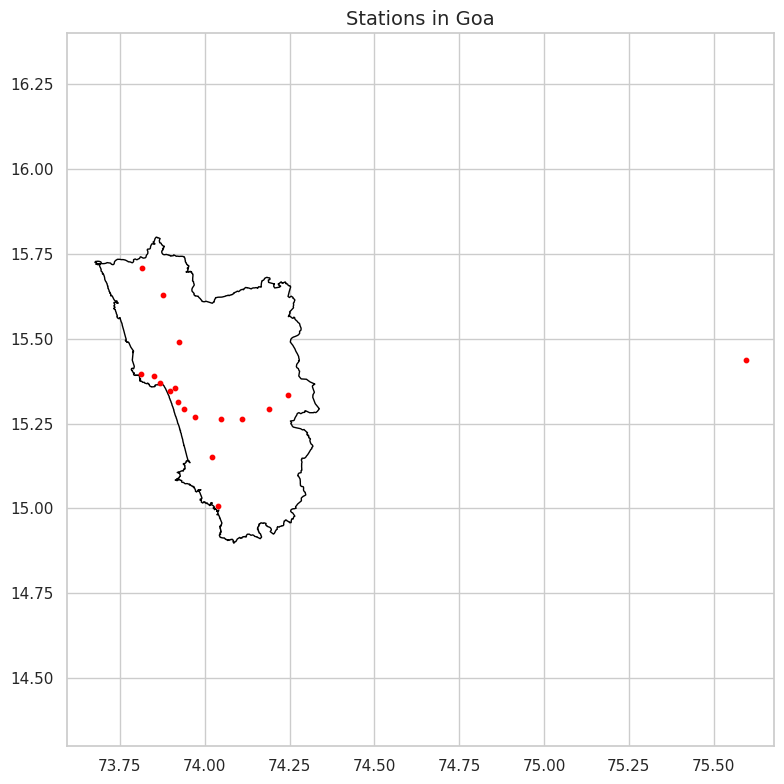

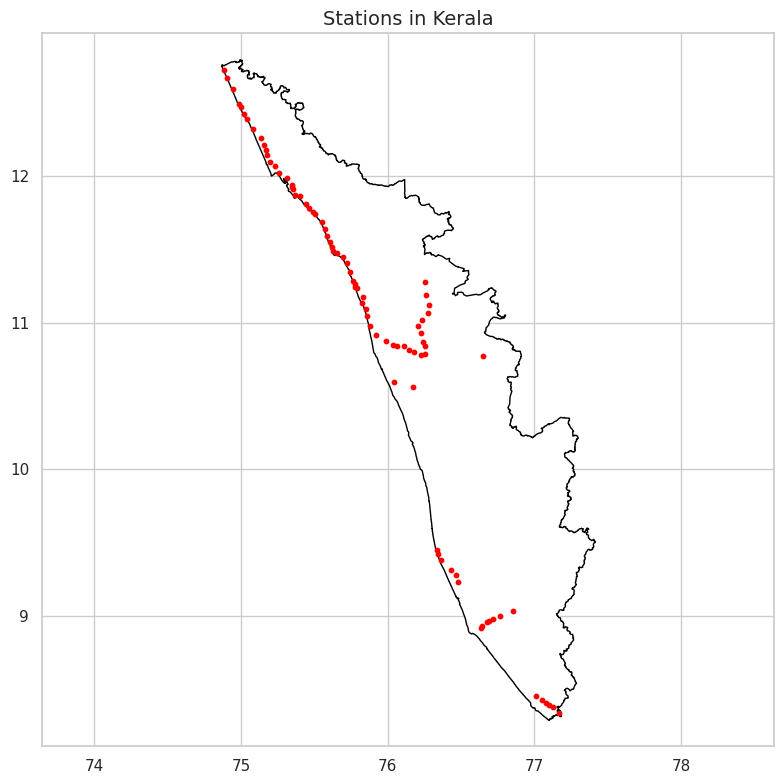

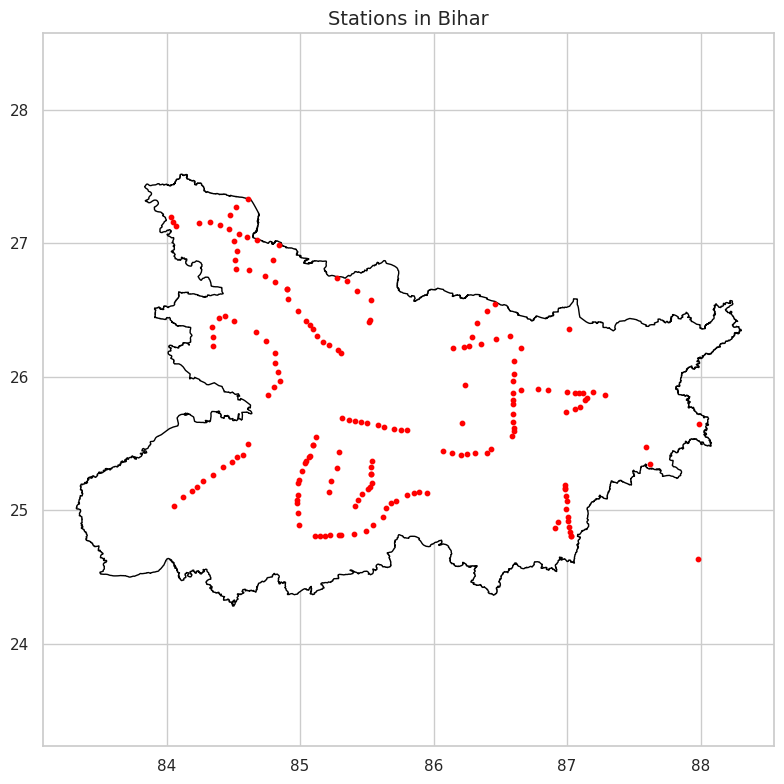

Skipping Chhattisgarh (no matching boundary found)


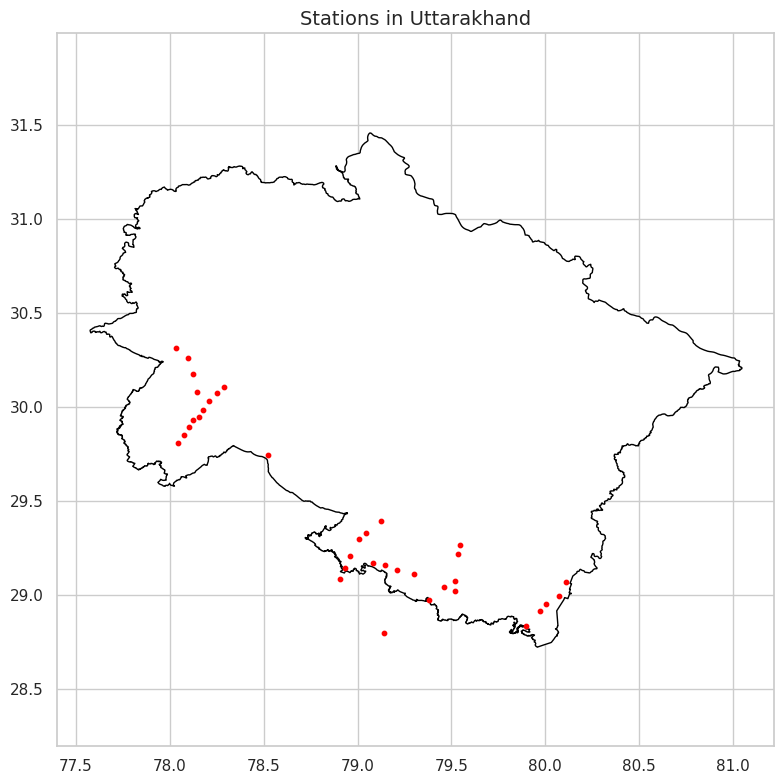

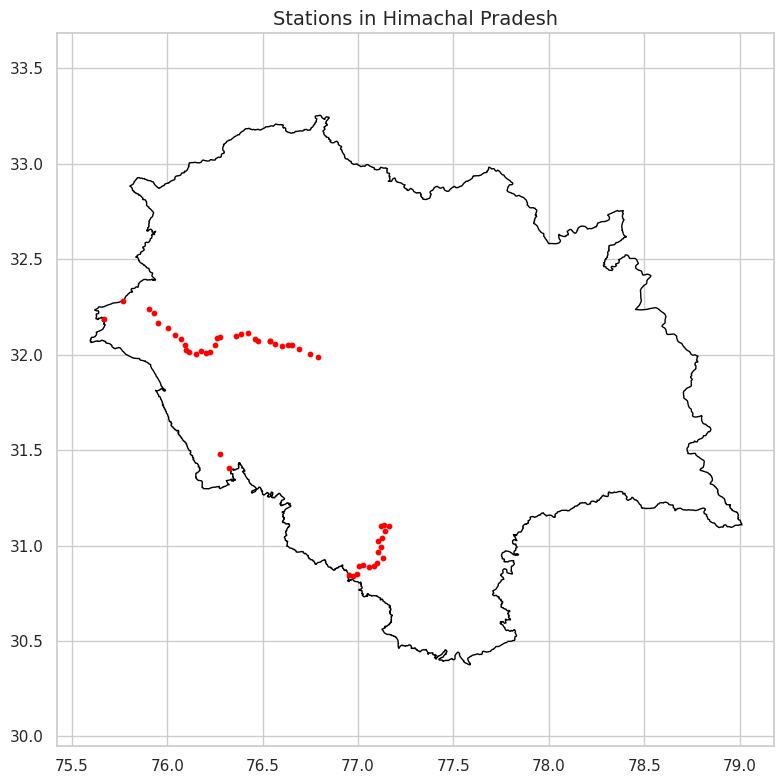

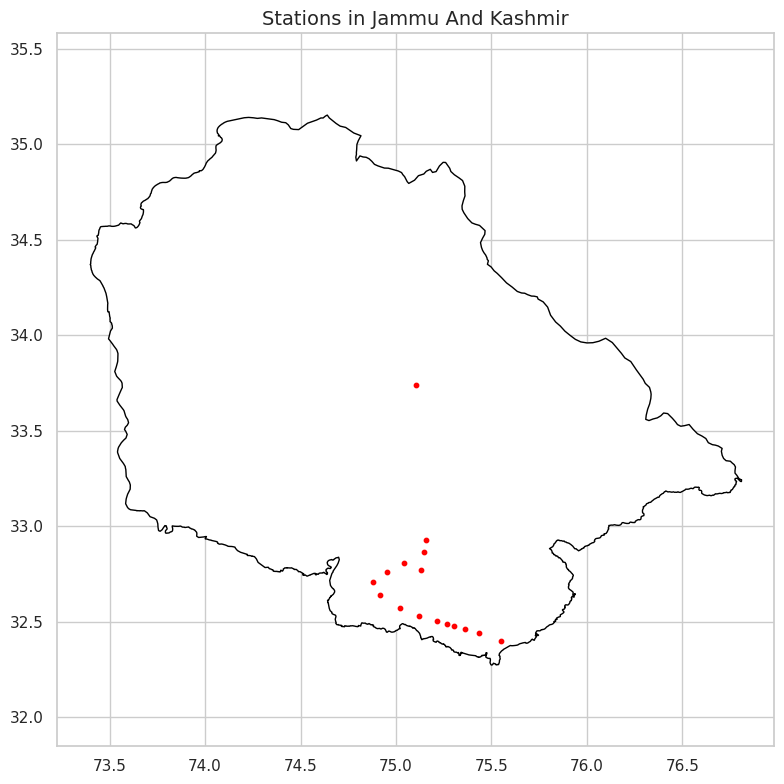

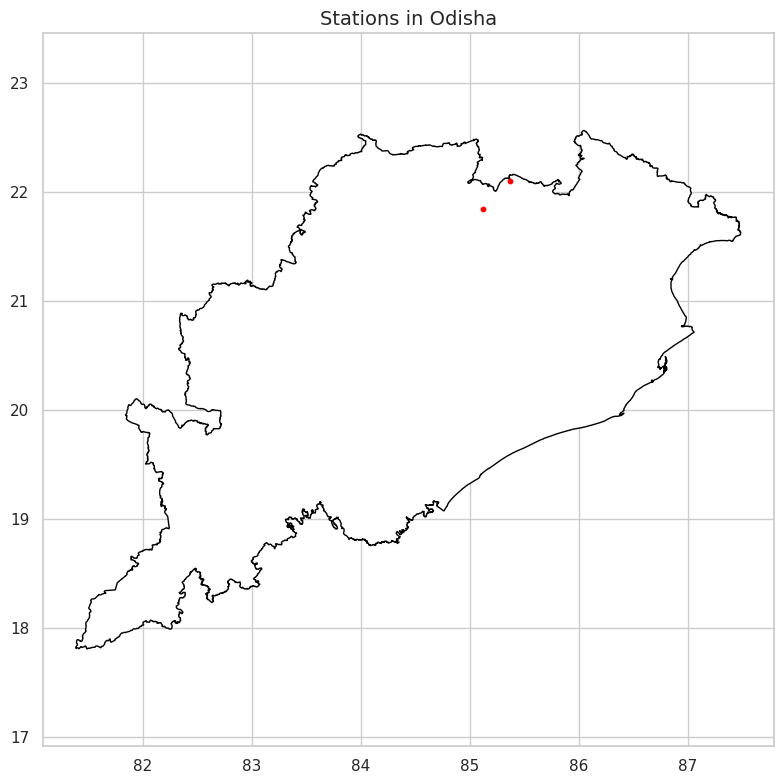

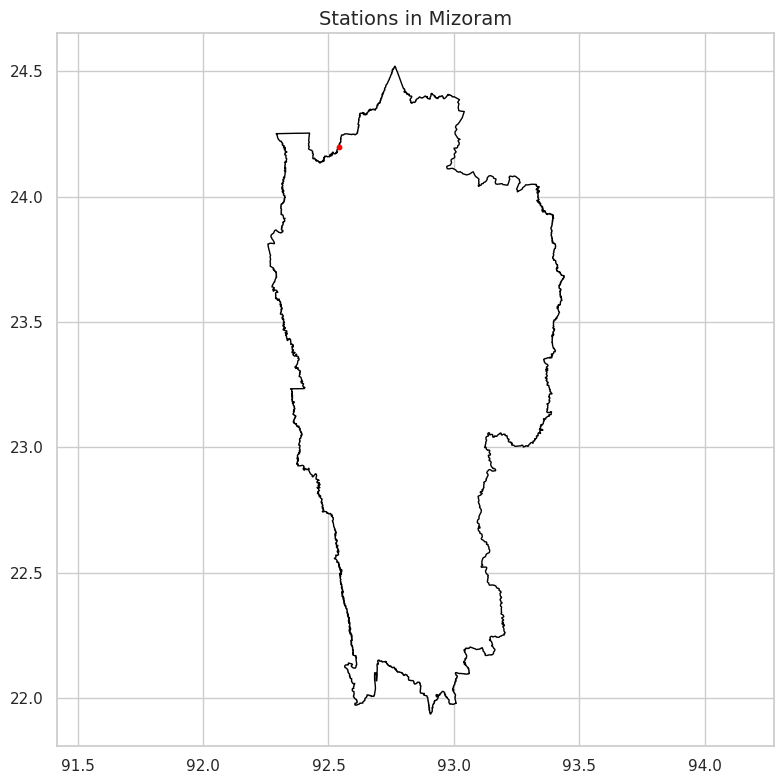

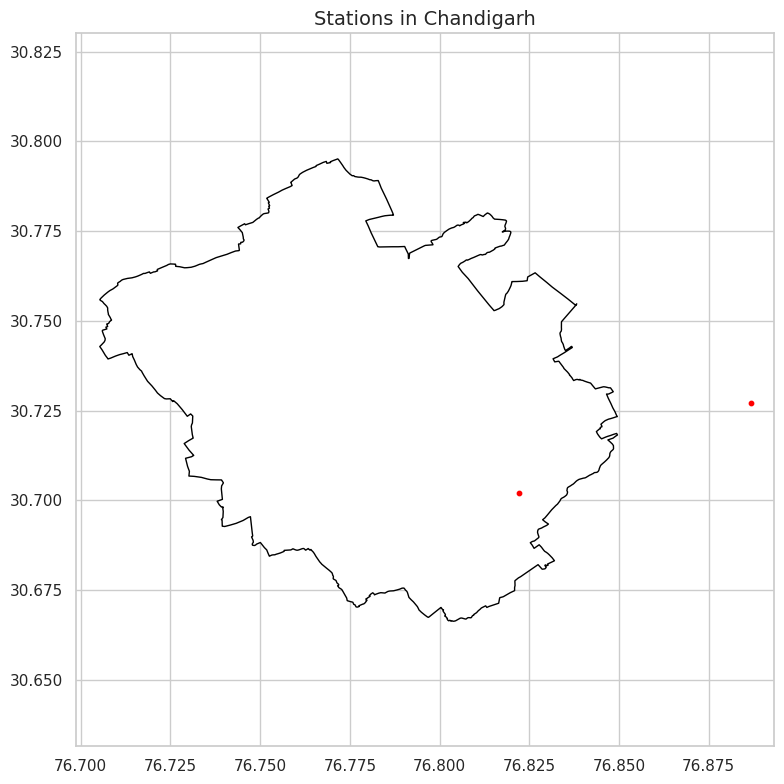

Skipping Bangladesh (no matching boundary found)


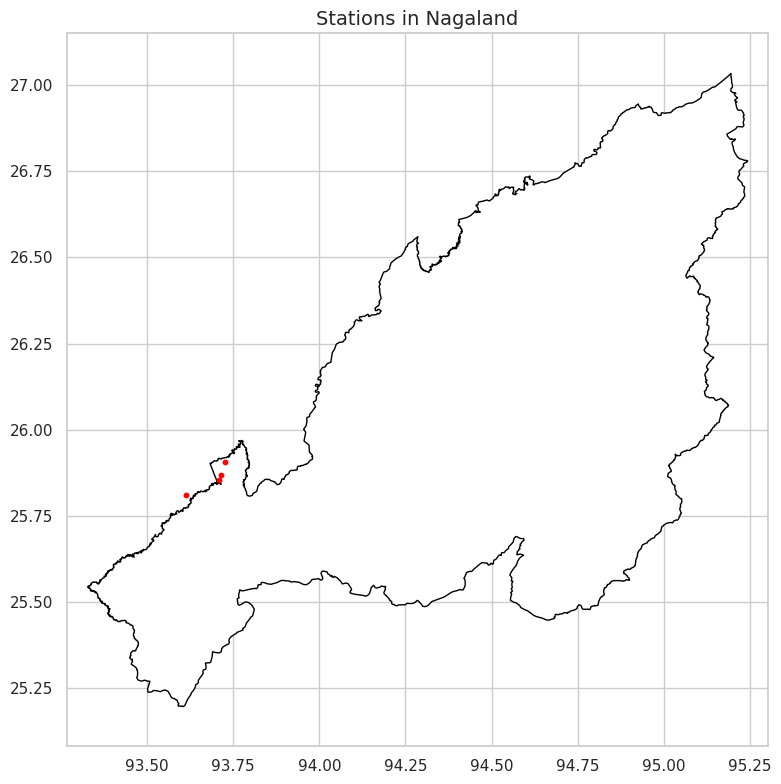

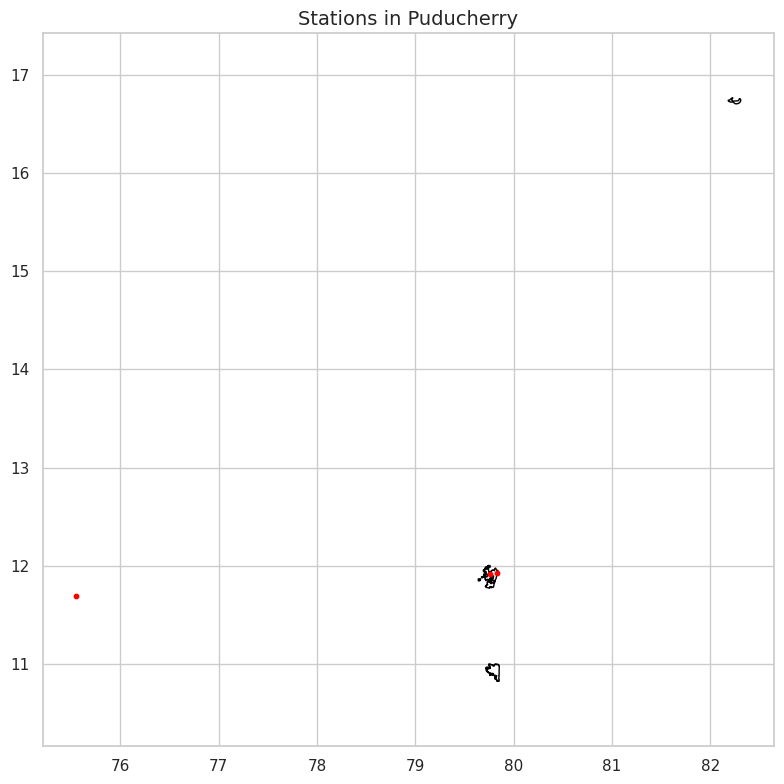

In [190]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Ensure both GeoDataFrames are using the same CRS
stations_gdf = stations_gdf.to_crs(epsg=4326)
mj = mj.to_crs(epsg=4326)

# Standardize state names for matching
stations_gdf['state'] = stations_gdf['state'].str.strip().str.title()
mj['state'] = mj['state'].str.strip().str.title()

# Loop through each state
for state in stations_gdf['state'].unique():
    # Filter stations and boundary for the state
    state_stations = stations_gdf[stations_gdf['state'] == state]
    state_boundary = mj[mj['state'] == state]

    if state_boundary.empty:
        print(f"Skipping {state} (no matching boundary found)")
        continue

    # Plot
    fig, ax = plt.subplots(figsize=(8, 8))
    state_boundary.plot(ax=ax, edgecolor='black', facecolor='white')
    state_stations.plot(ax=ax, color='red', markersize=10)

    plt.title(f"Stations in {state}", fontsize=14)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()


In [191]:

passengers=pd.read_csv("/content/drive/MyDrive/New folder/passengers.csv")
train_speed=pd.read_csv("/content/drive/MyDrive/New folder/trains speed.csv")
employees=pd.read_csv("/content/drive/MyDrive/New folder/employees.csv")
budget_railway=pd.read_csv("/content/drive/MyDrive/New folder/budget_railway.csv")
railwaylines=pd.read_csv("/content/drive/MyDrive/New folder/Railwaylines.csv")



In [199]:
employees.head()

,Year,Employees (Approximate)
0,2003,"14,70,000"
1,2004,"14,60,000"
2,2005,"14,55,000"
3,2006,"14,45,000"
4,2007,"14,35,000"


In [200]:
employees['Employees'] = employees['Employees (Approximate)'].str.replace(',', '')
employees['Employees'] = employees['Employees'].astype(int)

In [201]:
print("Dataset Info:")
print(employees.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Year                     21 non-null     int64 
 1   Employees (Approximate)  21 non-null     object
 2   Employees                21 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 636.0+ bytes
None


In [202]:
print("\nSummary Statistics:")
print(employees.describe())


Summary Statistics:
              Year     Employees
count    21.000000  2.100000e+01
mean   2013.000000  1.361905e+06
std       6.204837  7.082507e+04
min    2003.000000  1.250000e+06
25%    2008.000000  1.300000e+06
50%    2013.000000  1.360000e+06
75%    2018.000000  1.420000e+06
max    2023.000000  1.470000e+06


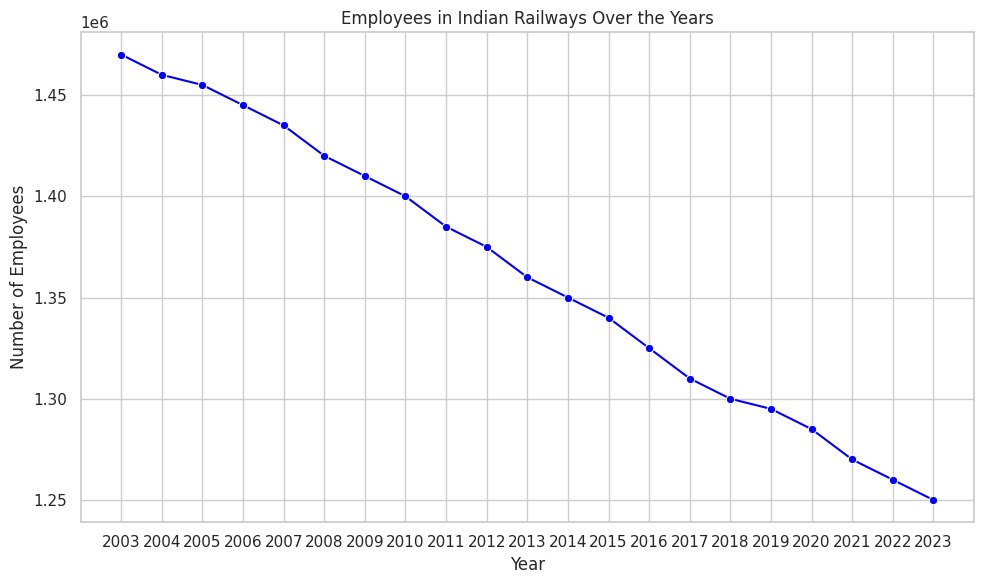

In [203]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=employees, x='Year', y='Employees', marker='o', color='blue')
plt.title('Employees in Indian Railways Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Employees')
plt.grid(True)

# Force x-axis ticks to be integers
plt.xticks(employees['Year'])

plt.tight_layout()
plt.show()


In [204]:
budget_railway.head()

,Fiscal Year,Allocation (₹ Billion)
0,2013–14,281.74
1,2014–15,657.98
2,2015–16,"1,000.11"
3,2016–17,"1,210.00"
4,2017–18,"1,310.00"


In [205]:
budget_railway['Allocation (₹ Billion)'] = budget_railway['Allocation (₹ Billion)'].astype(str).str.replace(',', '')
budget_railway['Allocation (₹ Billion)'] = budget_railway['Allocation (₹ Billion)'].astype(float)


In [206]:
print("Dataset Info:")
print(budget_railway.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Fiscal Year             12 non-null     object 
 1   Allocation (₹ Billion)  12 non-null     float64
dtypes: float64(1), object(1)
memory usage: 324.0+ bytes
None


In [207]:
print("\nSummary Statistics:")
print(budget_railway.describe())


Summary Statistics:
       Allocation (₹ Billion)
count               12.000000
mean              1382.485833
std                639.632719
min                281.740000
25%               1075.027500
50%               1355.000000
75%               1600.000000
max               2550.000000


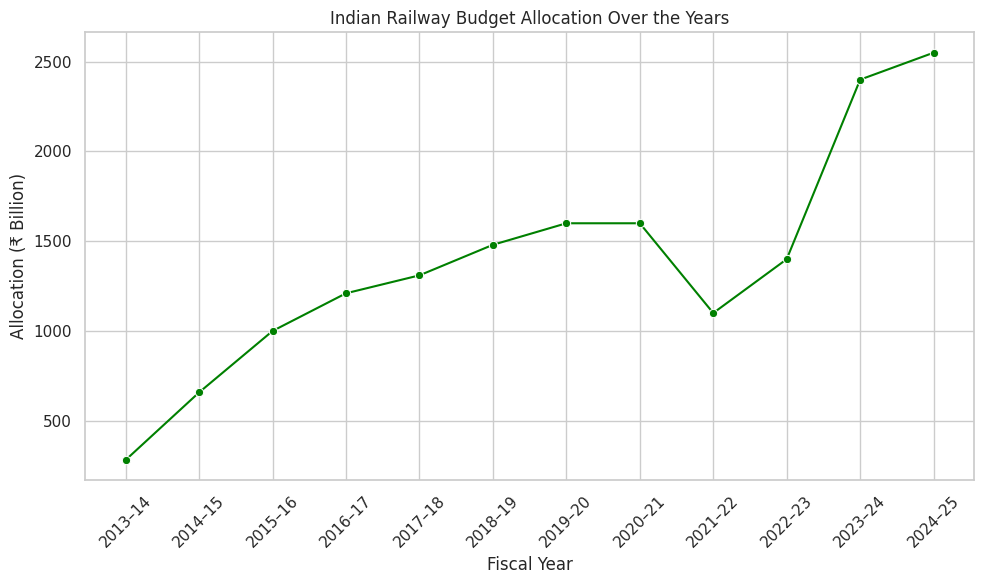

In [208]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=budget_railway, x='Fiscal Year', y='Allocation (₹ Billion)', marker='o', color='green')
plt.title('Indian Railway Budget Allocation Over the Years')
plt.xlabel('Fiscal Year')
plt.ylabel('Allocation (₹ Billion)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [209]:
train_speed.head()

,Year,Train Name,Top Speed (km/h)
0,2010,Bhopal Shatabdi Express,150
1,2015,Duronto,150
2,2016,Gatimaan Express,160
3,2018,Tejas Express,160
4,2019,Vande Bharat 1.0,160


In [210]:
print("Dataset Info:")
print(train_speed.info())

print("\nSummary Statistics:")
print(train_speed.describe())

print("\nMissing Values:\n", train_speed.isnull().sum())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Year              6 non-null      int64 
 1   Train Name        6 non-null      object
 2   Top Speed (km/h)  6 non-null      int64 
dtypes: int64(2), object(1)
memory usage: 276.0+ bytes
None

Summary Statistics:
              Year  Top Speed (km/h)
count     6.000000          6.000000
mean   2016.666667        156.666667
std       4.082483          5.163978
min    2010.000000        150.000000
25%    2015.250000        152.500000
50%    2017.000000        160.000000
75%    2018.750000        160.000000
max    2022.000000        160.000000

Missing Values:
 Year                0
Train Name          0
Top Speed (km/h)    0
dtype: int64


<ipython-input-211-1e6fc6311436>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




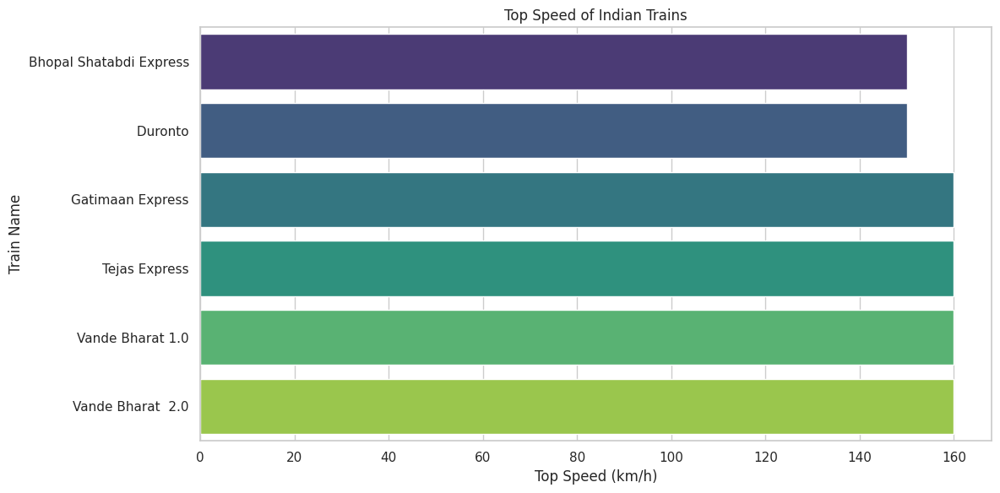

In [211]:
plt.figure(figsize=(12, 6))
sns.barplot(data=train_speed, x='Top Speed (km/h)', y='Train Name', palette='viridis')
plt.title('Top Speed of Indian Trains')
plt.xlabel('Top Speed (km/h)')
plt.ylabel('Train Name')
plt.tight_layout()
plt.show()

In [212]:
passengers.head()

,Fiscal Year,Passengers (in billions)
0,2003,5.112
1,2004,5.421
2,2005,5.831
3,2006,6.219
4,2007,6.522


In [213]:
# Display basic info
print("Dataset Info:")
print(passengers.info())

# Check for missing values
print("\nMissing Values:")
print(passengers.isnull().sum())

# Summary statistics
print("\nSummary Statistics:")
print(passengers.describe())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Fiscal Year               22 non-null     int64  
 1   Passengers (in billions)  22 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 484.0 bytes
None

Missing Values:
Fiscal Year                 0
Passengers (in billions)    0
dtype: int64

Summary Statistics:
       Fiscal Year  Passengers (in billions)
count    22.000000                 22.000000
mean   2013.500000                  6.893000
std       6.493587                  1.826818
min    2003.000000                  1.200000
25%    2008.250000                  6.264250
50%    2013.500000                  7.536000
75%    2018.750000                  8.175000
max    2024.000000                  8.421000


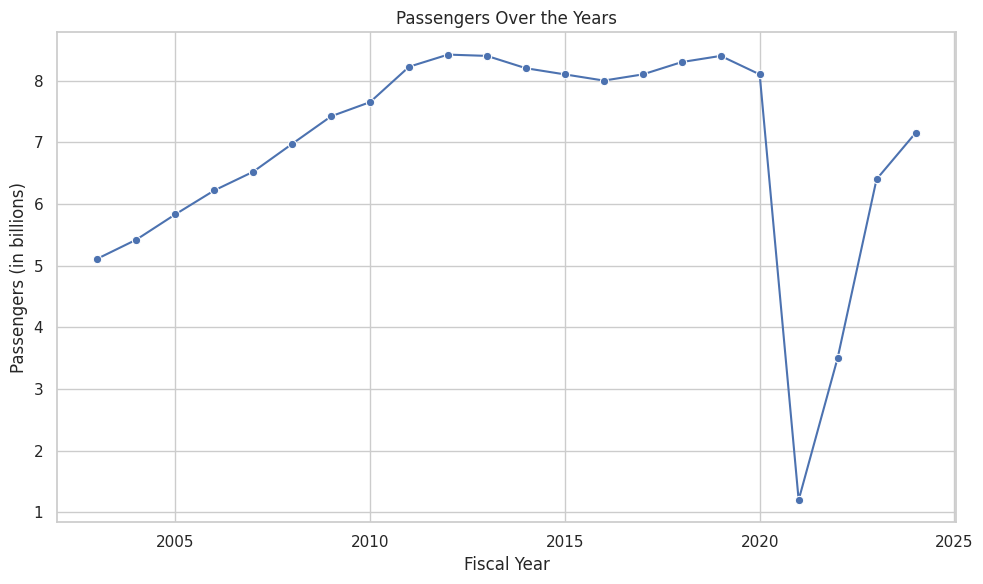

In [214]:
# Plot passengers over the years
plt.figure(figsize=(10, 6))
sns.lineplot(data=passengers, x='Fiscal Year', y='Passengers (in billions)', marker='o')
plt.title('Passengers Over the Years')
plt.xlabel('Fiscal Year')
plt.ylabel('Passengers (in billions)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [220]:
railwaylines.head()

,Country,2010 (km),2011(km),2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,🇺🇸 United States,"2,26,427","2,26,800","2,27,000","2,28,000","2,28,300","2,28,000","2,27,500","2,26,900","2,25,800","2,23,000","2,20,000","1,49,000","1,48,000","1,47,000","1,46,000"
1,🇨🇳 China,"91,000","91,000","98,000","1,05,000","1,13,000","1,21,000","1,24,000","1,27,000","1,31,000","1,39,000","1,46,000","1,50,000","1,55,000","1,59,000","1,59,000"
2,🇷🇺 Russia,"85,500","85,400","85,700","86,000","86,500","87,000","87,000","87,200","87,300","87,300","87,000","85,494","85,700","1,05,000","1,05,000"
3,🇮🇳 India,"63,974","64,000","64,400","64,600","64,800","65,000","65,300","65,900","66,500","66,900","67,000","65,554","66,000","68,584","68,584"
4,🇨🇦 Canada,"46,552","46,600","46,800","47,000","47,500","48,000","48,100","48,300","48,500","48,800","49,000","49,422","49,500","49,600","49,600"


In [225]:

# Assuming you already have the DataFrame `railwaylines`
# Clean column names: Extract only 4-digit years or 'Country'
railwaylines.columns = railwaylines.columns.str.extract(r'(\d{4})|Country')[0].fillna('Country')

# Clean data: remove commas and convert to float
year_cols = railwaylines.columns[1:]  # all except 'Country'
railwaylines[year_cols] = railwaylines[year_cols].replace(',', '', regex=True).astype(float)

In [226]:

# Convert from wide to long format
railway_melted = railwaylines.melt(id_vars='Country', var_name='Year', value_name='Length (km)')
railway_melted['Year'] = railway_melted['Year'].astype(int)


<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127482 (\N{REGIONAL INDICATOR SYMBOL LETTER U}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127480 (\N{REGIONAL INDICATOR SYMBOL LETTER S}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127464 (\N{REGIONAL INDICATOR SYMBOL LETTER C}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127475 (\N{REGIONAL INDICATOR SYMBOL LETTER N}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127479 (\N{REGIONAL INDICATOR SYMBOL LETTER R}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127470 (\N{REGIONAL INDICATOR SYMBOL LETTER I}) missing from font(s) DejaVu Sans.

<ipython-input-227-9957f0f99b60>:8: UserWarning:

Glyph 127462 (\N{REGIONAL INDICATOR SYMBOL LETTER A}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/d

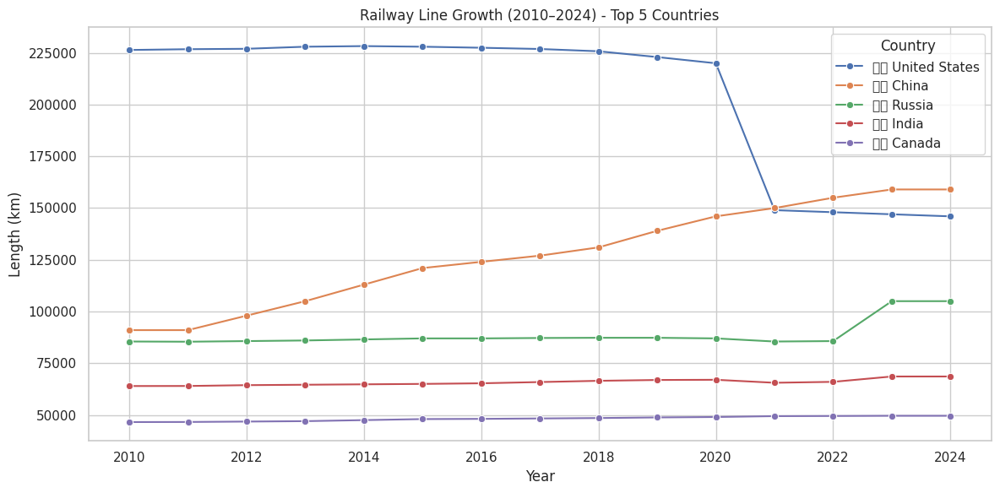

In [227]:
top_countries = railwaylines[['Country', '2024']].sort_values(by='2024', ascending=False).head(5)['Country']

plt.figure(figsize=(12, 6))
sns.lineplot(data=railway_melted[railway_melted['Country'].isin(top_countries)],
             x='Year', y='Length (km)', hue='Country', marker='o')
plt.title('Railway Line Growth (2010–2024) - Top 5 Countries')
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127482 (\N{REGIONAL INDICATOR SYMBOL LETTER U}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127480 (\N{REGIONAL INDICATOR SYMBOL LETTER S}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127464 (\N{REGIONAL INDICATOR SYMBOL LETTER C}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127475 (\N{REGIONAL INDICATOR SYMBOL LETTER N}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127479 (\N{REGIONAL INDICATOR SYMBOL LETTER R}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127470 (\N{REGIONAL INDICATOR SYMBOL LETTER I}) missing from font(s) DejaVu Sans.

<ipython-input-229-ae4145999b2b>:12: UserWarning:

Glyph 127462 (\N{REGIONAL INDICATOR SYMBOL LETTER A}) missing from font(s) DejaVu Sans.

<ipython-input-229-a

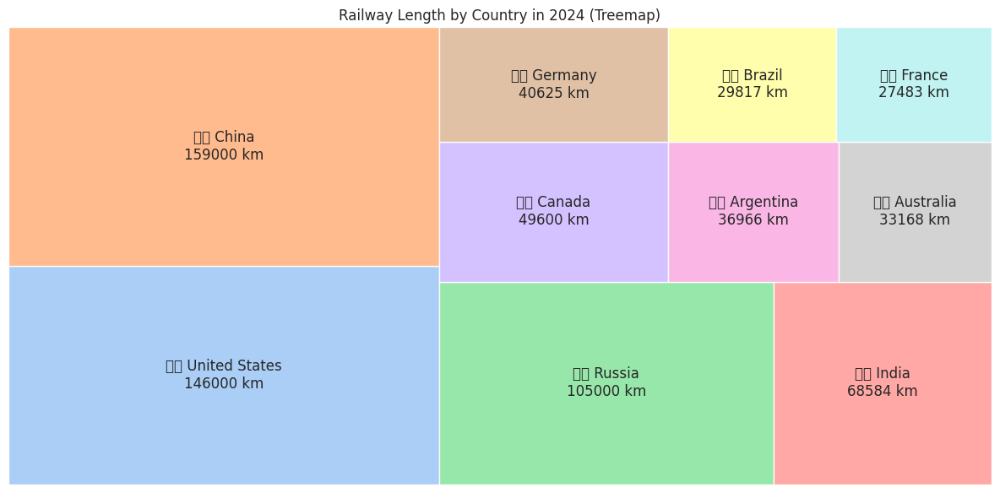

In [229]:
import squarify
latest_year = '2024'
plt.figure(figsize=(12, 6))
squarify.plot(
    sizes=railwaylines[latest_year],
    label=railwaylines['Country'] + "\n" + railwaylines[latest_year].astype(int).astype(str) + " km",
    color=sns.color_palette('pastel'),
    alpha=.9
)
plt.title(f'Railway Length by Country in {latest_year} (Treemap)')
plt.axis('off')
plt.tight_layout()
plt.show()

In [1]:
import pandas as pd 

In [6]:
df=pd.read_csv(r"C:\Users\singh\Downloads\IndianRailway_Revenue_2010_2024.csv")

In [7]:
df.head()

,Fiscal Year,Total Revenue,Freight Revenue,Passenger Revenue
0,2010-11,1045.0,693.0,258.0
1,2011-12,1170.0,740.0,300.0
2,2012-13,1261.8,852.6,313.2
3,2013-14,1432.1,939.1,366.3
4,2014-15,1610.2,1057.9,421.9


In [8]:
df.info()
df.describe()
df.isnull().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Fiscal Year        14 non-null     object 
 1   Total Revenue      14 non-null     float64
 2   Freight Revenue    14 non-null     float64
 3   Passenger Revenue  14 non-null     float64
dtypes: float64(3), object(1)
memory usage: 580.0+ bytes


Fiscal Year          0
Total Revenue        0
Freight Revenue      0
Passenger Revenue    0
dtype: int64

In [9]:
df.columns = df.columns.str.replace(' ', '_')


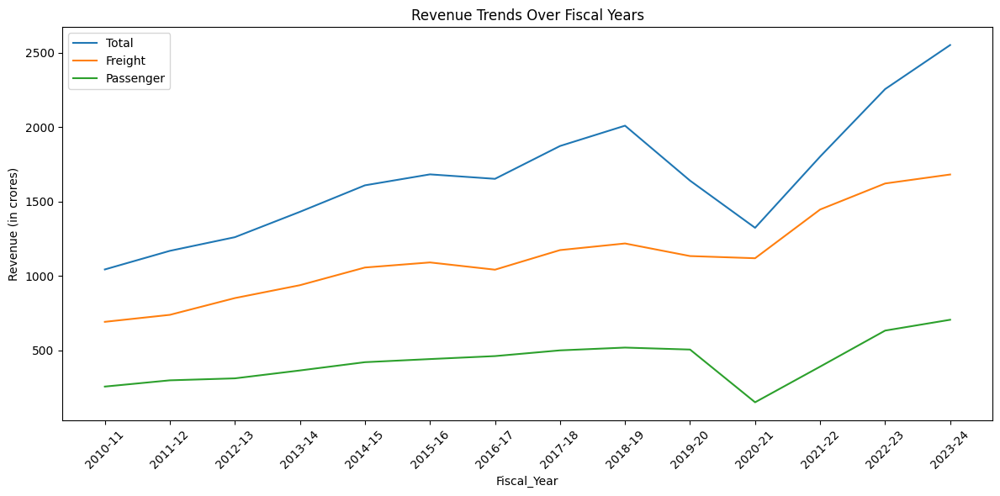

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.lineplot(x='Fiscal_Year', y='Total_Revenue', data=df, label='Total')
sns.lineplot(x='Fiscal_Year', y='Freight_Revenue', data=df, label='Freight')
sns.lineplot(x='Fiscal_Year', y='Passenger_Revenue', data=df, label='Passenger')
plt.xticks(rotation=45)
plt.title('Revenue Trends Over Fiscal Years')
plt.ylabel('Revenue (in crores)')
plt.legend()
plt.tight_layout()
plt.show()


In [11]:
df['Total_Growth_%'] = df['Total_Revenue'].pct_change() * 100
df['Freight_Growth_%'] = df['Freight_Revenue'].pct_change() * 100
df['Passenger_Growth_%'] = df['Passenger_Revenue'].pct_change() * 100

df[['Fiscal_Year', 'Total_Growth_%', 'Freight_Growth_%', 'Passenger_Growth_%']]


,Fiscal_Year,Total_Growth_%,Freight_Growth_%,Passenger_Growth_%
0,2010-11,NaN,NaN,NaN
1,2011-12,11.961722,6.782107,16.279070
2,2012-13,7.846154,15.216216,4.400000
3,2013-14,13.496592,10.145437,16.954023
4,2014-15,12.436282,12.650410,15.178815
5,2015-16,4.570861,3.232820,4.953781
6,2016-17,-1.781684,-4.459299,4.516712
7,2017-18,13.332930,12.612613,8.318928
8,2018-19,7.288054,3.787234,3.730301
9,2019-20,-18.364911,-6.937269,-2.557692


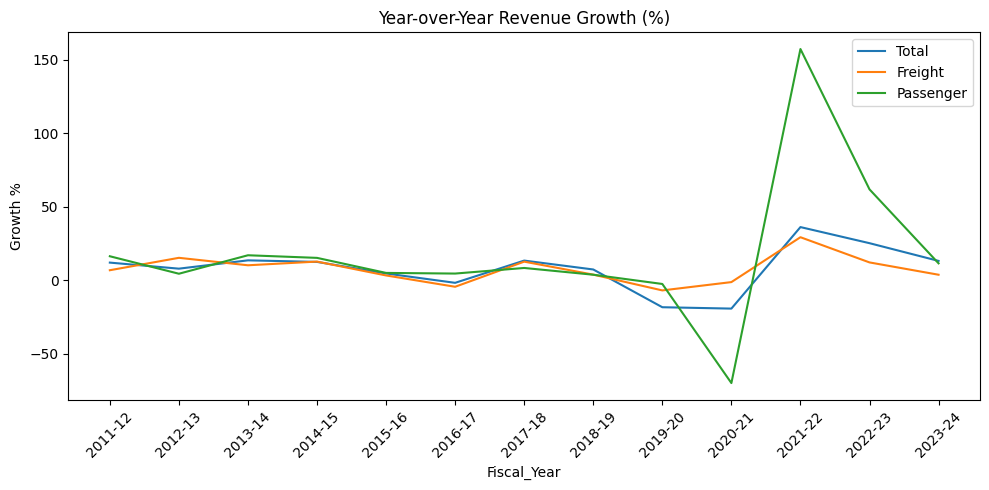

In [12]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='Fiscal_Year', y='Total_Growth_%', data=df, label='Total')
sns.lineplot(x='Fiscal_Year', y='Freight_Growth_%', data=df, label='Freight')
sns.lineplot(x='Fiscal_Year', y='Passenger_Growth_%', data=df, label='Passenger')
plt.title('Year-over-Year Revenue Growth (%)')
plt.xticks(rotation=45)
plt.ylabel('Growth %')
plt.legend()
plt.tight_layout()
plt.show()


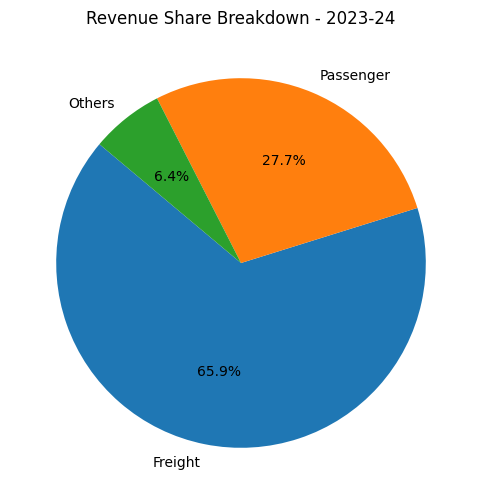

In [13]:
latest = df.iloc[-1]
labels = ['Freight', 'Passenger', 'Others']
sizes = [latest['Freight_Revenue'], latest['Passenger_Revenue'],
         latest['Total_Revenue'] - latest['Freight_Revenue'] - latest['Passenger_Revenue']]

plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title(f'Revenue Share Breakdown - {latest["Fiscal_Year"]}')
plt.show()
